# Imports

In [1]:
import numpy as np
import os
from pytorch_lightning import Trainer

import torch
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

import logging
logging.basicConfig(level=logging.ERROR)
logger = logging.getLogger(__name__)

/usr/local/lib/python3.10/dist-packages/torch/cuda/__init__.py:716: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


False
0


RuntimeError: No CUDA GPUs are available

In [2]:
from orbit_generation.constants import EM_MU
from orbit_generation.data import TSFeatureWiseScaler, create_dataloaders, discard_random_labels, remove_duplicates_preserve_order
from orbit_generation.processing import reorder_orbits, interpolate_equal_times
from orbit_generation.visualize import export_dynamic_orbits_html, plot_corr_matrix, visualize_static_orbits, export_dynamic_orbits_html
from orbit_generation.stats import plot_histograms_comparison
from orbit_generation.dataset import get_first_period_dataset_all_systems, get_orbit_classes, get_system_constants
from orbit_generation.model_factory import get_model
from orbit_generation.architectures import VAELossHistory
from orbit_generation.propagation import jacobi_constant, calculate_errors_per_orbit
from orbit_generation.experiment import setup_new_experiment, add_experiment_metrics, get_experiment_data
from orbit_generation.evaluation import evaluate_clustering_multiple_labels, find_nearest_orbits_batch, calculate_pairwise_orbit_distances, calculate_distances_batch, find_nearest_points_batch, calculate_pairwise_distances
from orbit_generation.latent_space import plot_linear_regression, sample_random_distributions, plot_2d_latent_space, plot_combined_2d_latent_space, reduce_dimensions_latent_space, compute_centroids, grid_sample, reduce_dimensions_combined_latent_space
# from orbit_generation.convergence import process_diferential_correction_orbits

# Parameters

In [3]:
data_path = r"/orbit-generation/data/orbits_fix_1500/"
experiments_folder = "../experiments"

The following cell will be overriden by the '03_02_experiment_parameterization' script

In [4]:
# parameters
data_used = "default_data"
families_to_discard = 0
seq_len = 100
feature_dim = 7
epochs = 10
val_split = 0.05
batch_size = 32
lr = 0.001
model_name = "cvae_conv5_legit"
latent_dim = 2
model_kwargs = {'dropout_rate': 0.2, 'cond_dim': 1}
max_iter_convergence = 25
input_seq_len_convergence = 1
samples_to_generate = 100
distance_metric = "euclidean"
want_to_train = "True"
want_to_generate = "True"
want_to_get_cluster_metrics = "True"
want_to_perform_convergence = "True"
want_to_discover = "True"

In [5]:
# Construct the params dictionary
params = {
    # Data
    'data_used': data_used,
    'families_to_discard': families_to_discard,
    'seq_len': seq_len,
    'feature_dim': feature_dim,
    # Training
    'epochs': epochs,
    'val_split': val_split,
    'batch_size': batch_size,
    'lr': lr,
    # Model
    'model_name': model_name,
    'latent_dim': latent_dim,
    # Convergence
    'max_iter_convergence': max_iter_convergence,
    'input_seq_len_convergence': input_seq_len_convergence,
    # Evaluation
    'samples_to_generate': samples_to_generate,
    'distance_metric': distance_metric,
    # Model Hyperparameters
    'model_kwargs': model_kwargs
}

In [6]:
def str_to_bool(value):
    return value.strip().lower() == "true" if isinstance(value, str) else bool(value)

# Convert string parameters to booleans
want_to_train = str_to_bool(want_to_train)
want_to_generate = str_to_bool(want_to_generate)
want_to_get_cluster_metrics = str_to_bool(want_to_get_cluster_metrics)
want_to_perform_convergence = str_to_bool(want_to_perform_convergence)
want_to_discover = str_to_bool(want_to_discover)

# Saving paths

In [7]:
# Experiment
experiment_folder = setup_new_experiment(params, experiments_folder)
images_folder = os.path.join(experiment_folder, 'images')
if not os.path.exists(images_folder):
    os.makedirs(images_folder)
experiment_id = int(os.path.basename(experiment_folder).split('_')[1])

New experiment setup complete: ../experiments/experiment_186
Parameters saved to ../experiments/experiments.json.


In [8]:
# Images
## Orbits
static_all_orbit_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.png')
dynamic_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.html')
refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.png')
dynamical_refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.html')
generated_orbits_that_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_converged.png')
generated_orbits_that_did_not_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_not_converged.png')
## Latent Spaces
latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_latent_space')
full_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_full_latent_space')
discarded_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_discarded_latent_space')
combined_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space')
combined_latent_space_arrows_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space_arrows')
family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_centroids')
full_family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_full_family_centroids')
## Feature Spaces
features_plot_path = os.path.join(images_folder, f'exp{experiment_id}_features')
family_feature_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_feature_centroids')
## Other
model_losses_path = os.path.join(images_folder, f'exp{experiment_id}_model_losses.png')
histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_histogram_comparison.png')
full_histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_full_histogram_comparison.png')

# Model
model_save_path = os.path.join(experiment_folder, f'exp{experiment_id}_model.pth')

# Orbits
generated_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_generated_orbits.npy')
refined_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits.npy')

# Latent Representations
latent_representations_path = os.path.join(experiment_folder, f'exp{experiment_id}_latent_representations.npy')
family_centroids_path = os.path.join(experiment_folder, f'exp{experiment_id}_family_centroids.npy')

# Features
generation_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_generation_df.csv')
refined_orbits_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits_df.csv')


# Data

## Import

In [9]:
data, orbit_df, labels, system_dict = get_first_period_dataset_all_systems(folder_path=data_path, segment_length=params['seq_len'])
data.shape

(270808, 7, 100)

In [10]:
system_dict

{'EM_mu': np.float64(0.01215058560962404),
 'EM_LU': np.float64(389703.0),
 'EM_TU': np.float64(382981.0),
 'EM_VU': np.float64(1.0175517845532807),
 'EM_Lx1': np.float64(0.8369151257723573),
 'EM_Ly1': np.float64(0.0),
 'EM_Lx2': np.float64(1.1556821654448846),
 'EM_Ly2': np.float64(0.0),
 'EM_Lx3': np.float64(-1.005062645810278),
 'EM_Ly3': np.float64(0.0),
 'EM_Lx4': np.float64(0.48784941439037594),
 'EM_Ly4': np.float64(0.8660254037844386),
 'EM_Lx5': np.float64(0.48784941439037594),
 'EM_Ly5': np.float64(-0.8660254037844386),
 'JE_mu': np.float64(2.52801752854e-05),
 'JE_LU': np.float64(668519.0),
 'JE_TU': np.float64(48562.0),
 'JE_VU': np.float64(13.766298752110703),
 'JE_Lx1': np.float64(0.9797641045894183),
 'JE_Ly1': np.float64(0.0),
 'JE_Lx2': np.float64(1.020461385981616),
 'JE_Ly2': np.float64(0.0),
 'JE_Lx3': np.float64(-1.0000105334063683),
 'JE_Ly3': np.float64(0.0),
 'JE_Lx4': np.float64(0.4999747198247146),
 'JE_Ly4': np.float64(0.8660254037844386),
 'JE_Lx5': np.floa

In [11]:
orbit_df['system'].value_counts()

system
EM     45211
SaT    42255
SE     41044
JE     40616
SaE    36196
MP     34904
SM     30582
Name: count, dtype: int64

In [12]:
orbit_df.head()

,id_class,x_0,y_0,x_0,vx_0,vy_0,vz_0,jacobi,period,stability,propagated_periods,system
0,1.0,0.941000,1.900442e-23,0.509474,2.968938e-13,-0.124968,-3.122717e-12,2.745412,11.555291,211.184678,3.0,EM
1,1.0,0.941538,-8.592698e-24,0.508602,2.902340e-13,-0.125672,-3.252212e-12,2.746226,11.551622,210.329145,3.0,EM
2,1.0,0.942076,6.956604e-24,0.507729,2.685527e-13,-0.126375,-2.862050e-12,2.747039,11.547936,209.473685,3.0,EM
3,1.0,0.942613,1.763946e-24,0.506856,3.153637e-13,-0.127078,-3.791054e-12,2.747850,11.544233,208.618315,3.0,EM
4,1.0,0.943150,9.441804e-24,0.505982,2.663322e-13,-0.127781,-2.982720e-12,2.748660,11.540511,207.763051,3.0,EM


In [13]:
periods = orbit_df['period'].values
periods

array(['EM', 'EM', 'EM', ..., 'SaT', 'SaT', 'SaT'], dtype=object)

In [15]:
orbits_id_classes = orbit_df['id_class'].values
orbits_id_classes

array([ 1.,  1.,  1., ..., 41., 41., 41.])

Remove the time variable if specified in params

In [16]:
if params['feature_dim']==6:
    data=data[:,1:,:]
    data.shape

Remove specific families from the training data

Get Features

In [17]:
orbits_id_classes = orbit_df['id_class'].values
family_labels = get_orbit_classes(orbits_id_classes)[0]

feature_names=['jacobi', 'period', 'stability']
features=orbit_df[feature_names].to_numpy()

## Scaling

In [18]:
scaler = TSFeatureWiseScaler()        
scaled_data = scaler.fit_transform(torch.tensor(data, dtype=torch.float32))
scaled_data.shape

torch.Size([270808, 7, 100])

# Modelling

In [19]:
import importlib
from orbit_generation import model_factory

# Reload the model_factory module
importlib.reload(model_factory)

# Now you can use get_model again with the updated code
from orbit_generation.model_factory import get_model


In [20]:
model = get_model(params)

In [21]:
#| hide
#| export
import h5py
from scipy.io import loadmat
import numpy as np
import os
import pandas as pd
from typing import Optional, Any
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split

In [22]:
#| export
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader

def create_dataloaders(scaled_data, labels, val_split=0.2, batch_size=32):
    """
    Creates train/validation DataLoaders for a conditional VAE.
    
    Args:
        scaled_data (Tensor or np.ndarray): Main input data. Shape: [N, features, timesteps].
        labels (Tensor or np.ndarray): Condition data. Shape: [N] or [N, 1].
        val_split (float): Fraction of data to reserve for validation.
        batch_size (int): Batch size for DataLoaders.

    Returns:
        (train_dataloader, val_dataloader): DataLoaders returning (x, cond) pairs.
    """

    # Ensure labels is shape [N, 1] if it’s currently [N]
    if labels.ndim == 1:
        labels = labels.unsqueeze(-1) if isinstance(labels, torch.Tensor) else labels[:, None]

    if val_split > 0:
        # Convert to NumPy if they are PyTorch tensors
        if isinstance(scaled_data, torch.Tensor):
            scaled_data = scaled_data.cpu().numpy()
        if isinstance(labels, torch.Tensor):
            labels = labels.cpu().numpy()

        # Split into train and validation
        X_train_np, X_val_np, cond_train_np, cond_val_np = train_test_split(
            scaled_data,
            labels,
            test_size=val_split,
            shuffle=True,
            random_state=42
        )

        # Convert back to PyTorch tensors
        X_train = torch.from_numpy(X_train_np).float()
        X_val = torch.from_numpy(X_val_np).float()
        cond_train = torch.from_numpy(cond_train_np).float()
        cond_val = torch.from_numpy(cond_val_np).float()

        train_dataset = TensorDataset(X_train, cond_train)  # (x, condition)
        val_dataset = TensorDataset(X_val, cond_val)        # (x, condition)

        train_dataloader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, pin_memory=True)
        val_dataloader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4, pin_memory=True)
    else:
        # If no validation split, use all data for training
        if isinstance(scaled_data, torch.Tensor):
            scaled_data = scaled_data.float()
        if isinstance(labels, torch.Tensor):
            labels = labels.float()

        train_dataset = TensorDataset(scaled_data, labels)  # (x, condition)
        train_dataloader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, pin_memory=True)
        val_dataloader = None

    return train_dataloader, val_dataloader


In [23]:
if want_to_train:
    train_loader, val_loader = create_dataloaders(
        scaled_data, 
        periods, 
        val_split=params.get('val_split', 0.1), 
        batch_size=params.get('batch_size', 32)
    )

    loss_history = VAELossHistory()

    trainer = Trainer(
        max_epochs=params.get('epochs', 10),
        log_every_n_steps=10,
        devices="auto",
        accelerator="auto",
        enable_progress_bar=True,
        enable_model_summary=True,
        callbacks=[loss_history]
    )

    trainer.fit(model, train_loader, val_loader)

    for metric_name, metric_value in trainer.callback_metrics.items():
        print(f"{metric_name}: {metric_value}")


Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. T

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:370: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1036.)
  return F.conv1d(


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


train_total_loss: 6.993130683898926
train_reconstruction_loss: 4.453943729400635
train_kl_loss: 2.539186954498291
val_total_loss: 9.29331111907959
val_reconstruction_loss: 6.7751688957214355
val_kl_loss: 2.518132448196411


Metrics added to experiment with ID 186 in ../experiments/experiments.json.


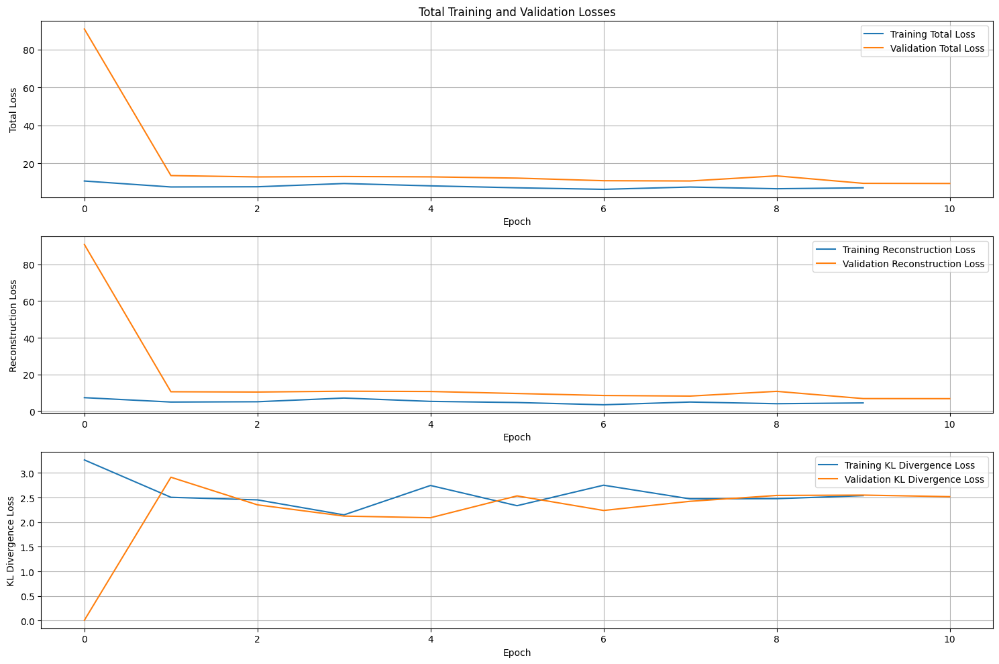

In [24]:
if want_to_train:
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=trainer.callback_metrics)
    torch.save(model.state_dict(), model_save_path)
    loss_history.plot_all_losses(save_path=model_losses_path)
else:
    model.load_state_dict(torch.load(model_save_path, weights_only=True))  

In [ ]:
stop

# Latent Space

## Dataset

In [25]:
scaled_data.shape

torch.Size([270808, 7, 100])

In [26]:
periods = torch.from_numpy(periods).unsqueeze(1).float()
periods.shape

torch.Size([270808, 1])

In [27]:
latent_means, latent_log_vars = model.encode(scaled_data, mus_data)

latent_means = latent_means.detach().numpy()
latent_log_vars = latent_log_vars.detach().numpy()

latent_representation = np.concatenate((latent_means, latent_log_vars), axis=1)
np.save(latent_representations_path, latent_representation)
latent_representation.shape

(270808, 4)

In [28]:
latent_log_vars = torch.from_numpy(latent_log_vars)
latent_stdevs = torch.exp(0.5 * latent_log_vars)
latent_stdevs = latent_stdevs.numpy()
latent_stdevs.shape

(270808, 2)

In [29]:
features.shape

(270808, 3)

Saved plot to ../experiments/experiment_186/images/exp186_latent_space


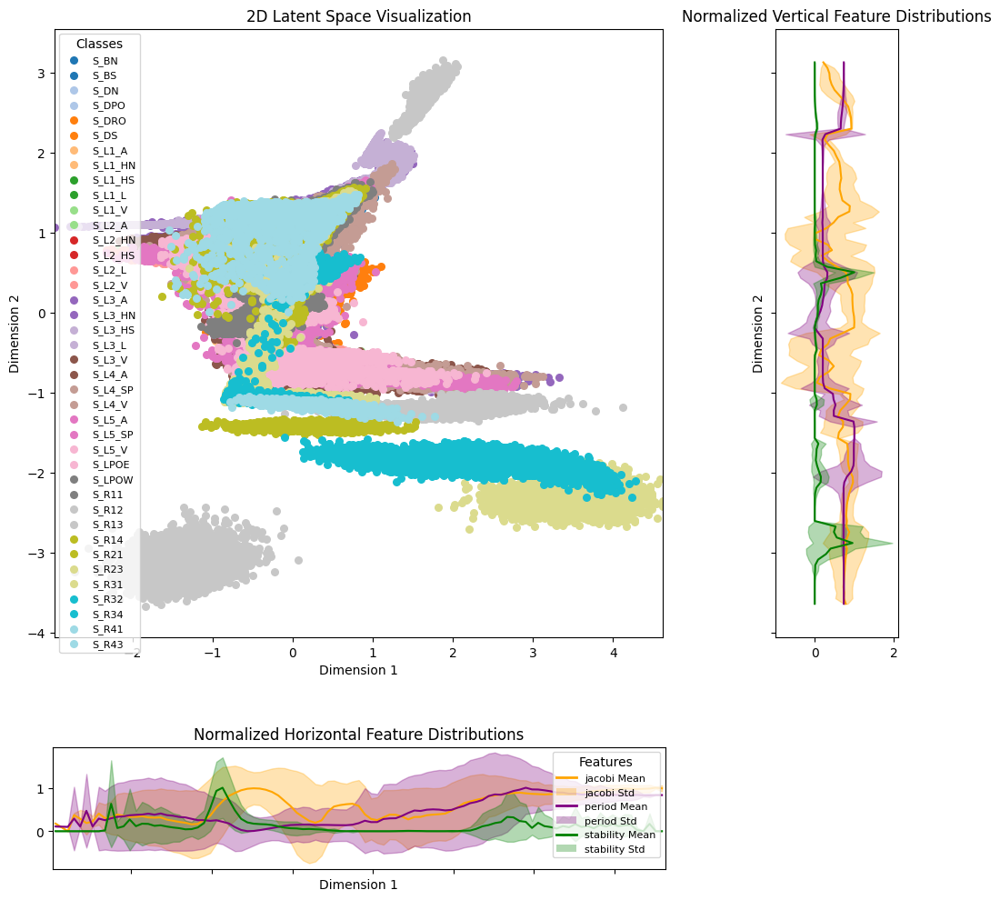

In [30]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(latent_means,
                            np.array(family_labels),
                            save_path=latent_space_path,
                            features=features,
                            feature_names=feature_names,
                            plot_std=True)
else:
    rls=reduce_dimensions_latent_space(latent_means,
                                        np.array(family_labels),
                                        techniques=['PCA','UMAP'],
                                        save_path=latent_space_path,
                                        show_legend=False)

## Regression

In [31]:
latent_means.shape

(270808, 2)

In [32]:
latent_stdevs.shape

(270808, 2)

In [33]:
features.shape

(270808, 3)

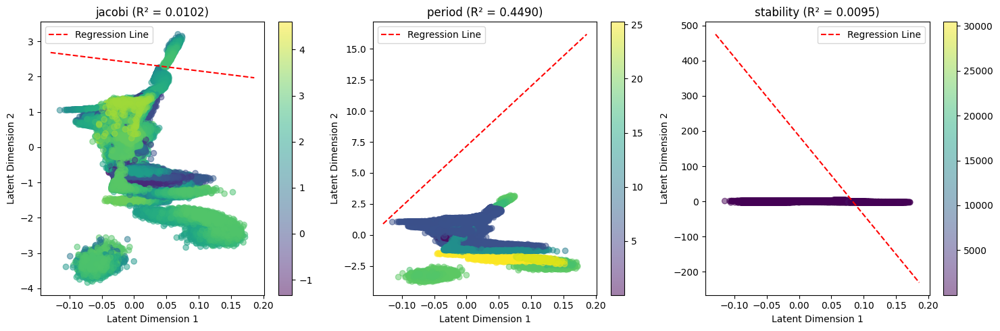

Metrics added to experiment with ID 186 in ../experiments/experiments.json.


In [34]:
_,regression_results = plot_linear_regression(latent_means, features, feature_names)
add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=regression_results)

## Centroids

In [35]:
# Compute centroids
centroid_means = compute_centroids(latent_means, orbits_id_classes, method='mean')
centroid_log_vars = compute_centroids(latent_log_vars, orbits_id_classes, method='mean')
centroids_representation = np.concatenate((centroid_means, centroid_log_vars), axis=1)
np.save(family_centroids_path, centroids_representation)
centroid_log_vars = torch.from_numpy(centroid_log_vars)
centroid_stdevs = torch.exp(0.5 * centroid_log_vars)
centroid_stdevs = centroid_stdevs.numpy()
centroid_stdevs.shape

(40, 2)

In [36]:
# Compute centroid labels
unique_classes = remove_duplicates_preserve_order(orbits_id_classes)
family_names=get_orbit_classes(unique_classes)[0]
len(family_names)

40

In [37]:
# Compute full data centroid
full_data_centroid = np.mean(latent_means, axis=0)
full_data_centroid

array([-0.00264693, -0.05422217], dtype=float32)

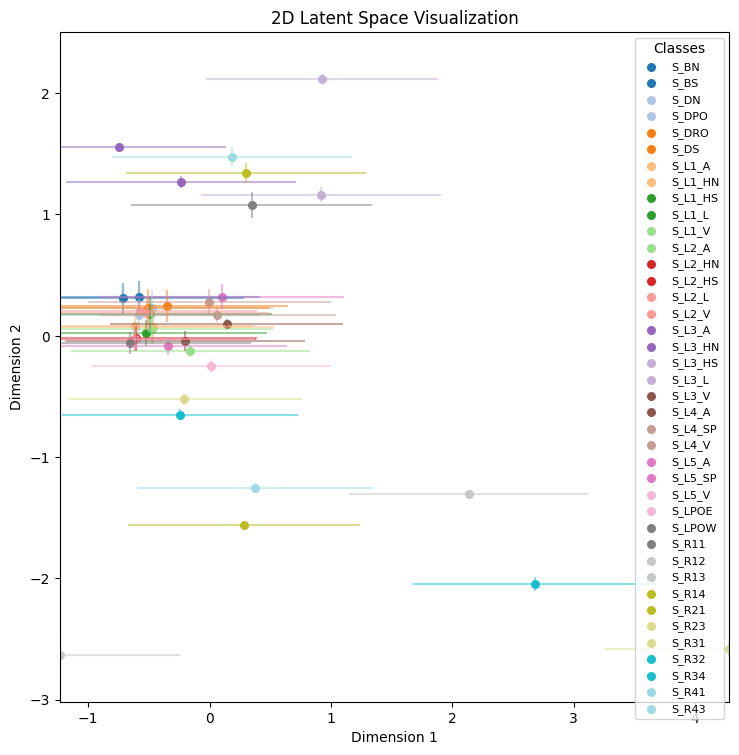

In [38]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(centroid_means,
                            np.array(family_names),
                            save_path=family_centroids_plot_path,
                            latent_stdevs=centroid_stdevs
                            )
else:
    rls=reduce_dimensions_latent_space(centroid_means,
                                        np.array(family_names),
                                        techniques=['PCA','UMAP'],
                                        save_path=family_centroids_plot_path,
                                        show_legend=False)

## Clustering

In [39]:
if want_to_get_cluster_metrics:
    cluster_metrics = evaluate_clustering_multiple_labels(latent_means, [family_labels], label_names=['family'], clustering_method='gmm')
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=cluster_metrics)

Metrics added to experiment with ID 186 in ../experiments/experiments.json.


# Generation

## Period = 

In [40]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['EM_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()
em_mus.shape

torch.Size([100, 1])

In [41]:
if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)
    print(generation.shape)

torch.Size([100, 7, 100])


/tmp/ipykernel_260633/4278824069.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


In [42]:
if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

(100, 6, 100)

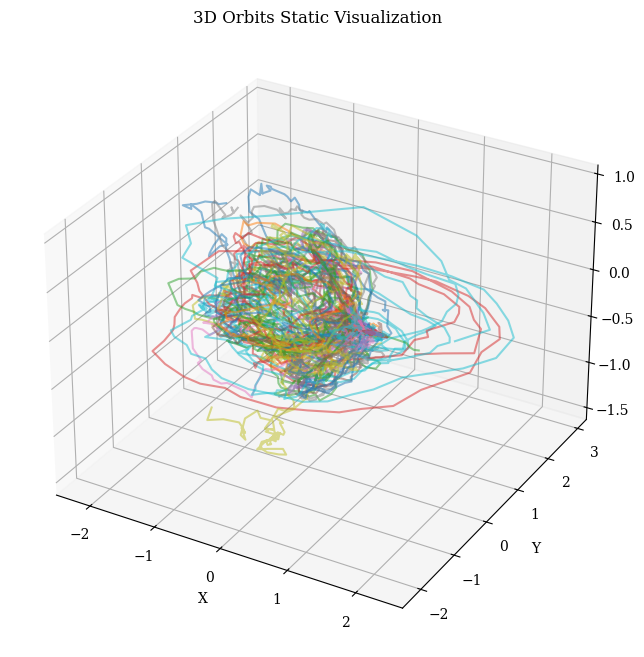

In [43]:
visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## JE

In [44]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['JE_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()
em_mus.shape

torch.Size([100, 1])

In [45]:
if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)
    print(generation.shape)

torch.Size([100, 7, 100])


/tmp/ipykernel_260633/4278824069.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


In [46]:
if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

(100, 6, 100)

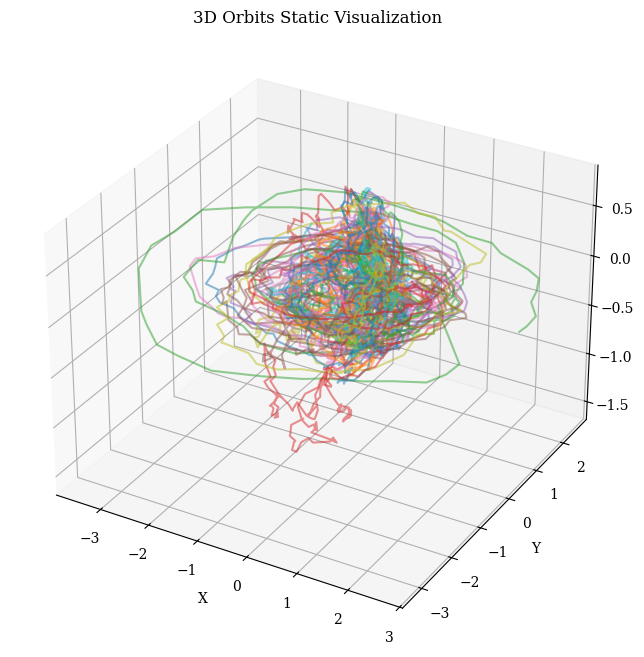

In [47]:
visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## MP

/tmp/ipykernel_260633/4042666066.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


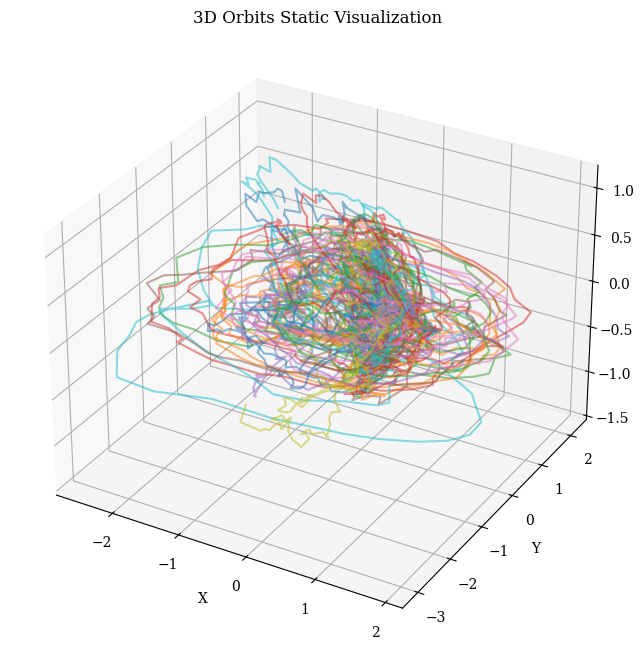

In [48]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['MP_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()

if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)

if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## SE

/tmp/ipykernel_260633/1195647420.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


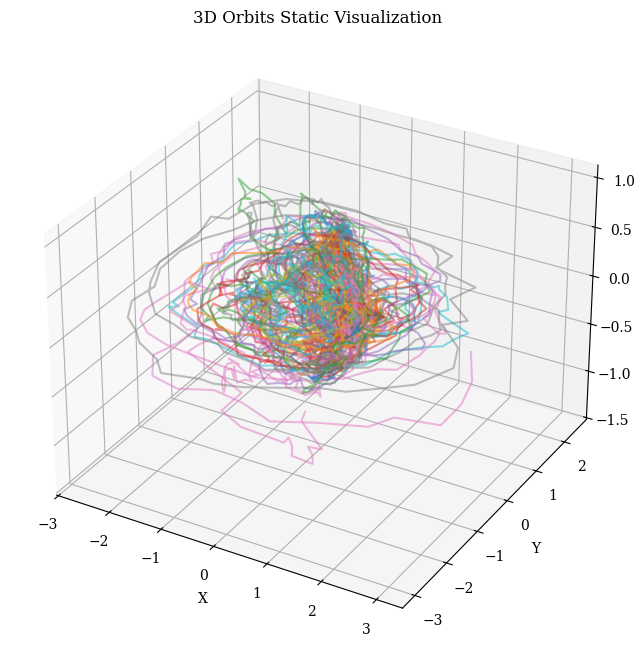

In [49]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['SE_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()

if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)

if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## SM

/tmp/ipykernel_260633/906804278.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


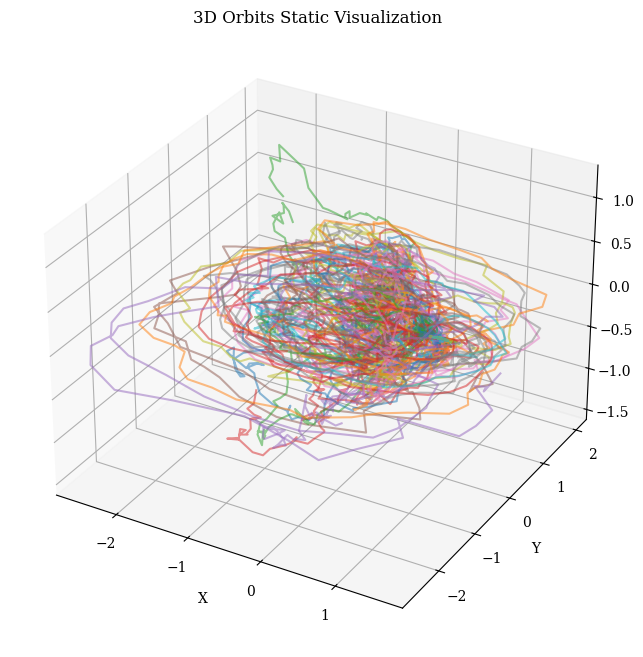

In [50]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['SM_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()

if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)

if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## SaE

/tmp/ipykernel_260633/3672614154.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


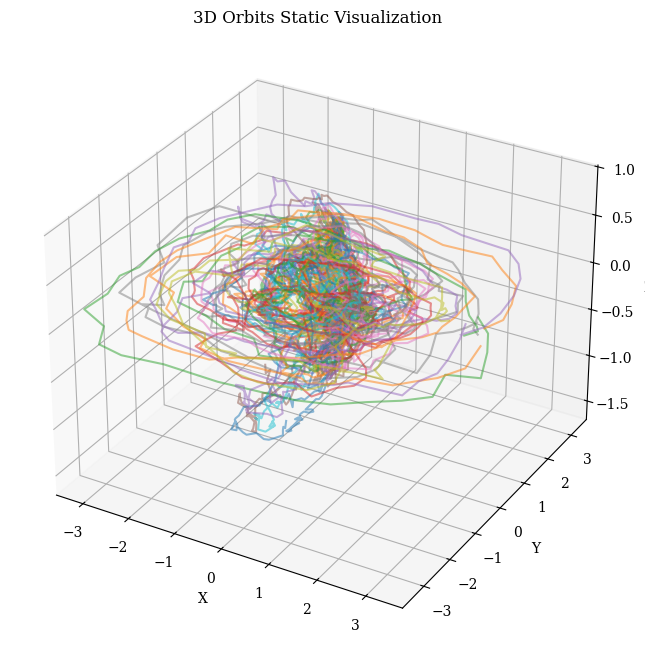

In [51]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['SaE_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()

if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)

if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

## SaT

/tmp/ipykernel_260633/1165889191.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))


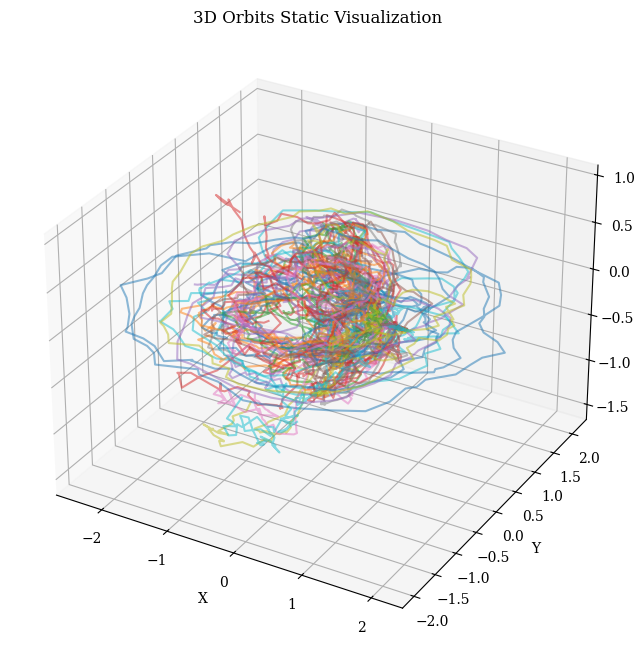

In [52]:
n_samples = params.get('samples_to_generate', 100)
em_mus = np.full(n_samples, system_dict['SaT_mu'])
em_mus = torch.from_numpy(em_mus).unsqueeze(1).float()

if want_to_generate:
    generation = model.sample(num_samples=n_samples, cond=torch.tensor(em_mus, dtype=torch.float32))
    generation = scaler.inverse_transform(generation)

if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

In [53]:
KLK

NameError: name 'KLK' is not defined

Normal Sampling

In [ ]:
if want_to_generate:
    random_generation = model.sample(params['samples_to_generate'])
    random_generation = scaler.inverse_transform(random_generation)
    print(random_generation.shape)

torch.Size([100, 7, 100])


Discarded Centroid Sampling

In [44]:
if want_to_generate:
    if params['families_to_discard']==0:
        discarded_centroids_generation = model.sample(params['samples_to_generate'])
    else:
        discarded_centroids_latent_samples = sample_random_distributions(discarded_centroid_means, discarded_centroid_log_vars, params['samples_to_generate'])
        discarded_centroids_generation = model.decode(discarded_centroids_latent_samples)
    discarded_centroids_generation = scaler.inverse_transform(discarded_centroids_generation)
    print(discarded_centroids_generation.shape)

torch.Size([100, 7, 100])


Grid Sampling

In [ ]:
if want_to_generate:
    grid_samples = grid_sample(latent_means, grid_size=params['samples_to_generate'])
    grid_generation = model.decode(torch.from_numpy(grid_samples))
    grid_generation = scaler.inverse_transform(grid_generation)
    print(grid_generation.shape)

torch.Size([100, 7, 100])


/usr/local/lib/python3.10/dist-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Save or Load

In [46]:
if want_to_generate:
    generation = torch.cat([random_generation, discarded_centroids_generation, grid_generation], dim=0)
    generation = generation.detach().cpu().numpy()
    np.save(generated_data_path, generation)
else:
    generation = np.load(generated_data_path)
    

generation.shape

(300, 7, 100)

## Visualization

In [47]:
if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

(300, 6, 100)

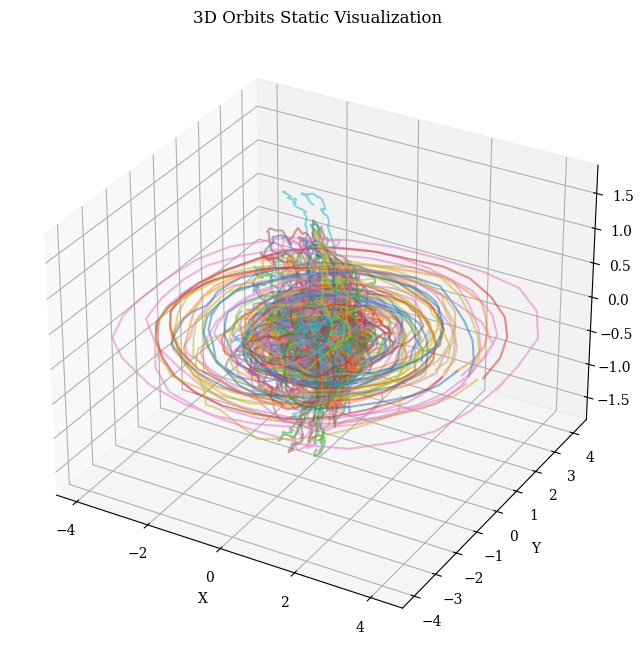

In [48]:
visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

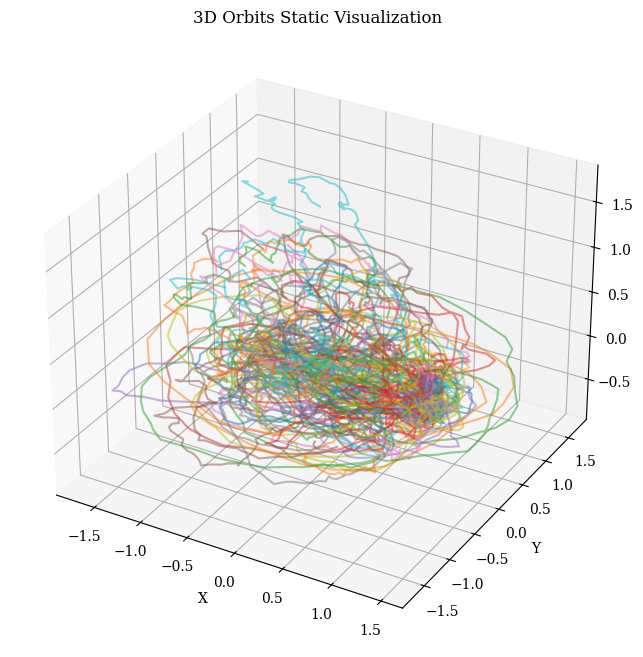

In [49]:
visualize_static_orbits(data= no_time_generation[0:100], show_legend=False)

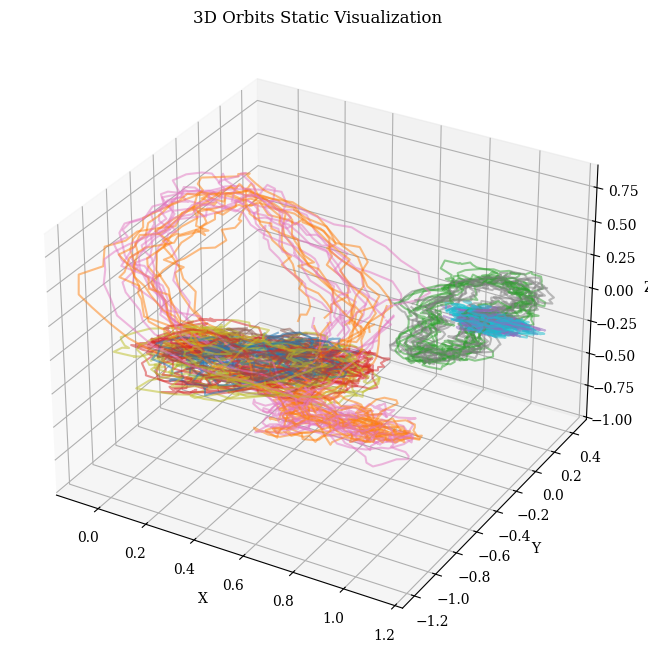

In [ ]:
visualize_static_orbits(data= no_time_generation[100:200], show_legend=False)

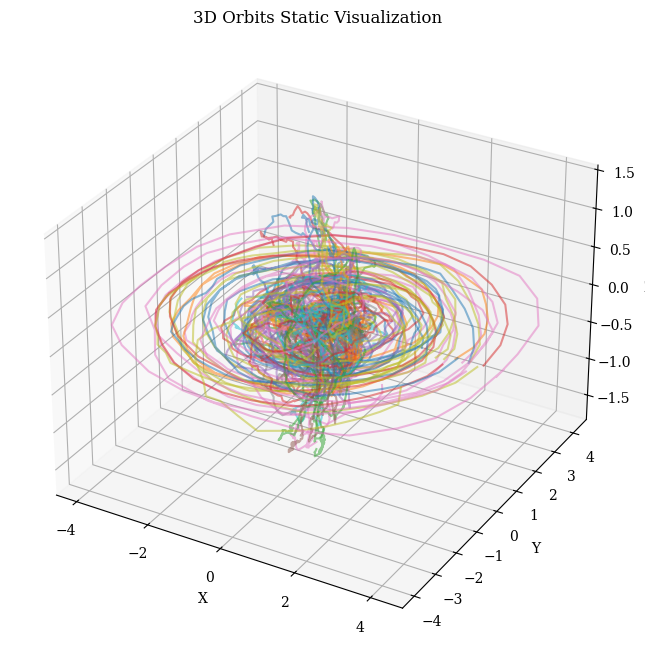

In [ ]:
visualize_static_orbits(data= no_time_generation[200:300], show_legend=False)

In [52]:
export_dynamic_orbits_html(data=no_time_generation, filename=dynamic_orbits_path)

Visualization saved to ../experiments/experiment_36/images/exp36_generated_orbits.html


## Coverage

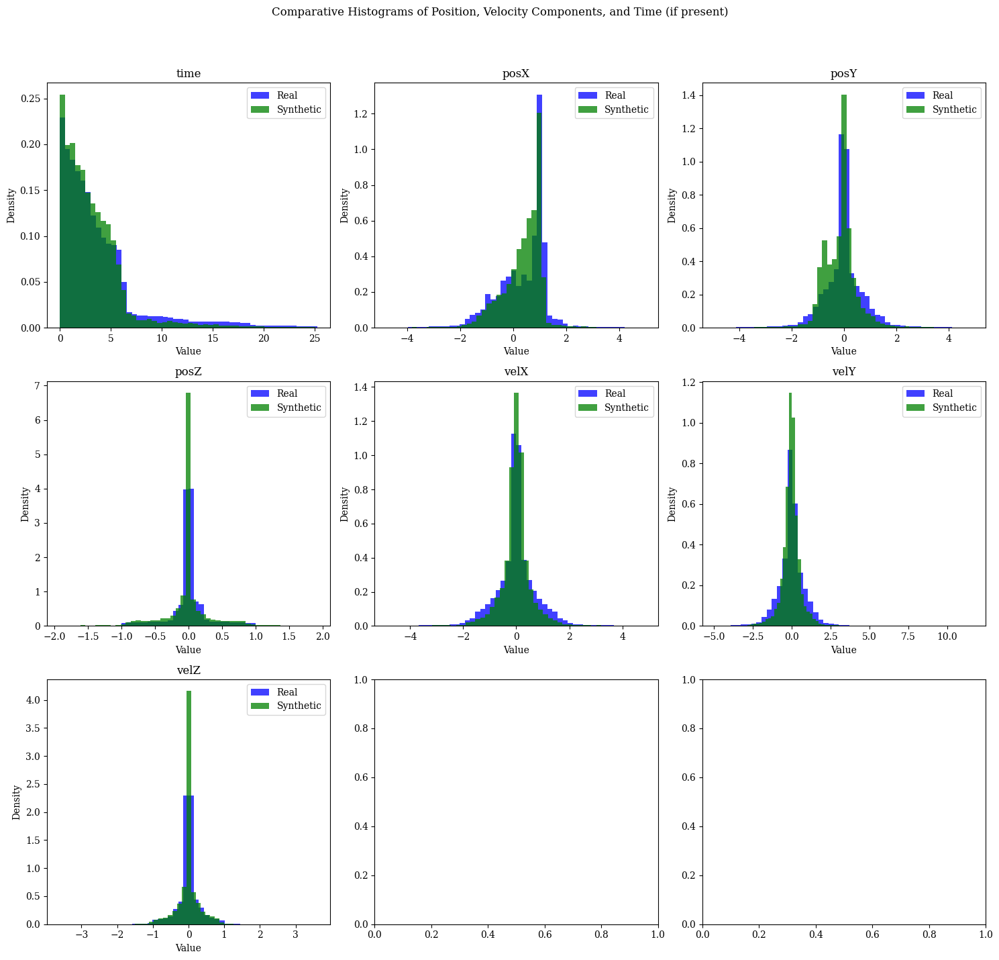

In [53]:
plot_histograms_comparison(data1=data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=histogram_comparison_path)

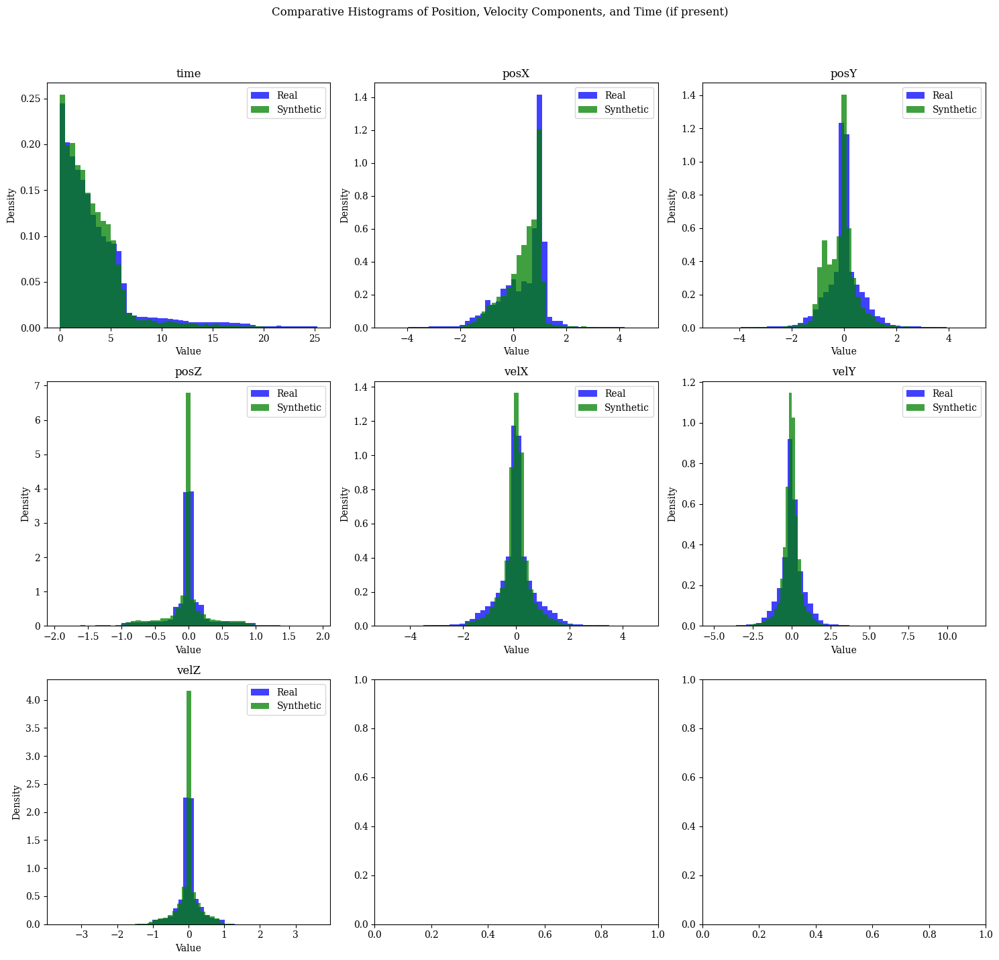

In [54]:
plot_histograms_comparison(data1=data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=full_histogram_comparison_path)

## Pheasibility

In [55]:
#Order metrics
reordered_generation, order_metrics_array, order_metric_labels = reorder_orbits(generation)
average_order_metrics = order_metrics_array.mean(axis=0)
average_order_metrics_dict = dict(zip(order_metric_labels, average_order_metrics))

In [56]:
if want_to_generate:
    # Pheasibility metrics
    per_orbit_errors = calculate_errors_per_orbit(reordered_generation,EM_MU)
    mean_errors = {key: np.mean(value) for key, value in per_orbit_errors.items()}
    
    generation_df = pd.DataFrame(per_orbit_errors)
    new_values_df = pd.DataFrame(order_metrics_array, columns=order_metric_labels)
    generation_df = pd.concat([generation_df, new_values_df], axis=1)

    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics={**mean_errors, **average_order_metrics_dict})

else:
    generation_df = pd.read_csv(generation_df_path)

Metrics added to experiment with ID 36 in ../experiments/experiments.json.


In [57]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0.110781,0.195583,0.503514,160.0,73.0,101.0,0.040808
1,0.208550,0.245012,0.154507,312.0,71.0,207.0,0.083636
2,0.187494,0.342019,1.569321,118.0,82.0,78.0,0.031515
3,0.829540,1.227539,1.310902,624.0,63.0,435.0,0.175758
4,0.068922,0.197615,1.477347,100.0,79.0,63.0,0.025455


# Convergence

In [58]:
# Interpolate similar time values to suceed in convergence
interpolated_generation = interpolate_equal_times(reordered_generation)
interpolated_generation.shape

(300, 7, 100)

In [59]:
if want_to_perform_convergence:
    refined_orbits, refined_orbits_df= process_diferential_correction_orbits(np.transpose(interpolated_generation,(0,2,1)),
                                                                        EM_MU,
                                                                        max_iter=params['max_iter_convergence'])
    refined_orbits = np.transpose(refined_orbits,(0,2,1))
    np.save(refined_data_path, refined_orbits)
else:
    refined_orbits = np.load(refined_data_path)
    refined_orbits_df = pd.read_csv(refined_orbits_df_path)

refined_orbits.shape

(127, 7, 100)

Order Metrics

In [60]:
# Order orbits and average metrics
reordered_refined_orbits, refined_order_metrics_array, refined_order_metric_labels = reorder_orbits(refined_orbits)
refined_average_order_metrics = refined_order_metrics_array.mean(axis=0)
refined_order_metrics = dict(zip(refined_order_metric_labels, refined_average_order_metrics))

# Add individual metrics to the df
new_values_df = pd.DataFrame(refined_order_metrics_array, columns=refined_order_metric_labels)
refined_orbits_df = pd.concat([refined_orbits_df, new_values_df], axis=1)

refined_order_metrics

{'disorder_metric': np.float64(191.49606299212599),
 'correct_order': np.float64(75.22834645669292),
 'inversions': np.float64(127.33858267716535),
 'kendall_tau_distance': np.float64(0.05144993239481412)}

Pheasibility Metrics

In [61]:
refined_per_orbit_errors = calculate_errors_per_orbit(reordered_refined_orbits,EM_MU)
refined_orbits_df['propagated_position_error'] = refined_per_orbit_errors['position_error']
refined_orbits_df['propagated_velocity_error'] = refined_per_orbit_errors['velocity_error']
refined_orbits_df['propagated_energy_error'] = refined_per_orbit_errors['energy_error']
refined_mean_errors = {key: np.mean(value) for key, value in refined_per_orbit_errors.items()}
refined_mean_errors

{'position_error': np.float64(2.955096466180972e-12),
 'velocity_error': np.float64(6.073855200986512e-12),
 'energy_error': np.float64(6.587271499057514e-12)}

In [62]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric.1,correct_order.1,inversions.1,kendall_tau_distance.1,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,2.906872,1.278837,0.092664,30810,0.000859,30787,1.967273,18.067548,2.529452,1.473080,22,1.137199,10,0.299181,0.177583,26,1.144660,29.0,29.0,60.0,82.0,35.0,0.014141,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,2.329807,0.988646,0.256935,24263,0.000219,24301,6.195145,17.485866,1.752072,1.731676,17,0.774913,10,0.182968,0.409377,20,0.780178,21.0,21.0,246.0,66.0,163.0,0.065859,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,3.059297,0.543481,0.284362,19684,0.000526,19717,4.485208,24.355919,2.807363,2.106530,13,0.471571,15,0.169371,0.603150,16,0.470883,17.0,17.0,112.0,77.0,75.0,0.030303,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,2.813566,3.112600,0.485831,14967,0.000247,16529,0.682594,20.105916,2.009000,4.021441,11,0.727810,27,0.595025,0.262876,13,0.728930,13.0,14.0,232.0,69.0,148.0,0.059798,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,0.783118,2.876062,0.176215,41484,0.003867,41526,3.864567,5.938849,1.636447,5.316860,31,0.353873,36,0.440313,0.612380,36,0.347611,39.0,39.0,68.0,85.0,38.0,0.015354,68.0,85.0,38.0,0.015354


In [63]:
refined_ids = refined_orbits_df['id'].astype(int).tolist()
generated_data_that_was_refined = generation[refined_ids]
generated_data_that_was_refined.shape

(127, 7, 100)

## Visualization

Refinement by Samplings

In [64]:
index_100 = refined_orbits_df[refined_orbits_df['id'] >= 100].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 100].empty else None
index_200 = refined_orbits_df[refined_orbits_df['id'] >= 200].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 200].empty else None

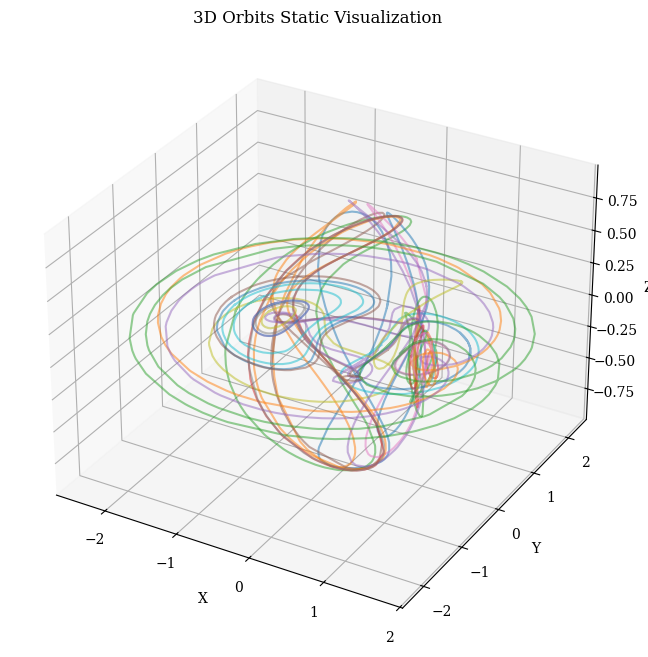

In [65]:
if np.any(reordered_refined_orbits[:index_100,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[:index_100,1:,:], show_legend=False)

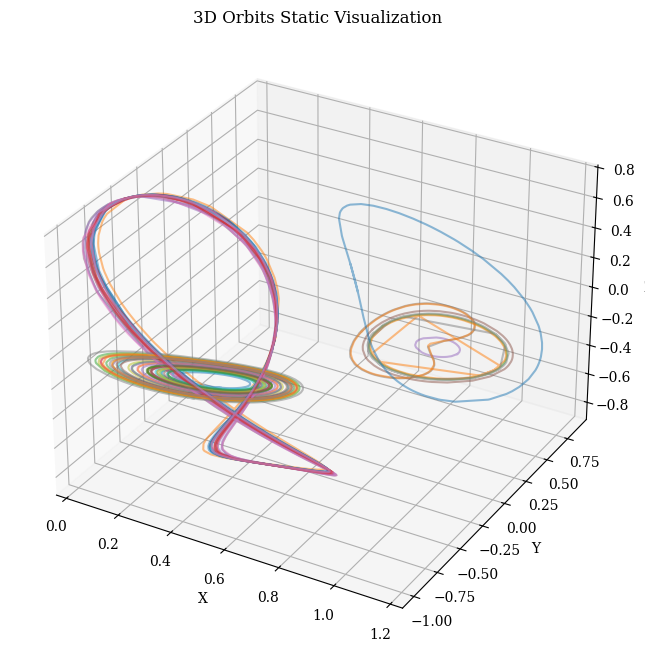

In [66]:
if np.any(reordered_refined_orbits[index_100:index_200,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[index_100:index_200,1:,:], show_legend=False)

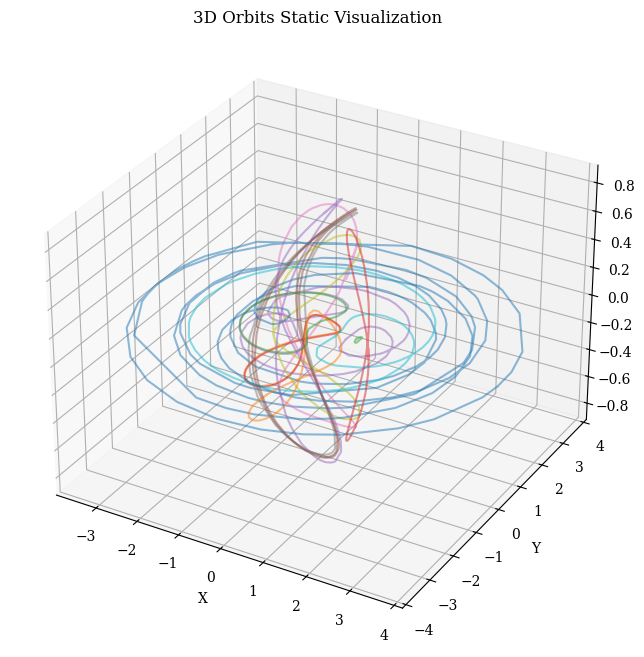

In [67]:
if np.any(reordered_refined_orbits[index_200:,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[index_200:,1:,:], show_legend=False)

Generation that was able to get Refined

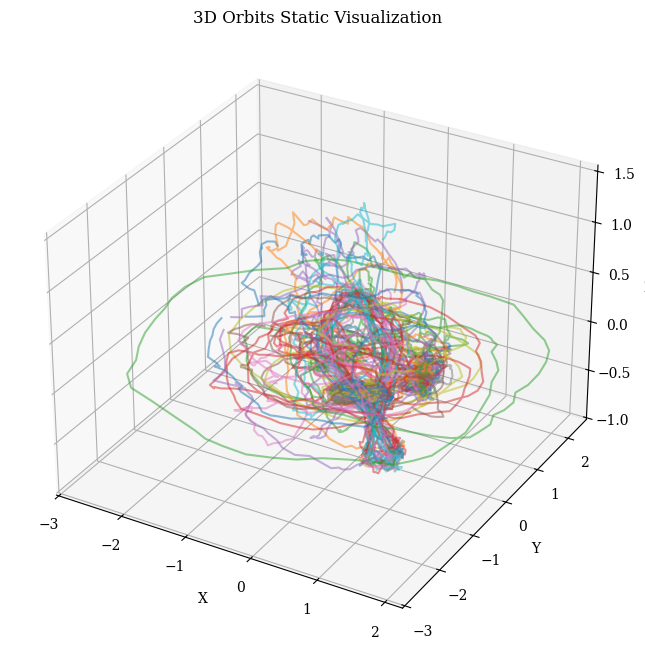

In [68]:
visualize_static_orbits(generated_data_that_was_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_converged_path)

Refinement

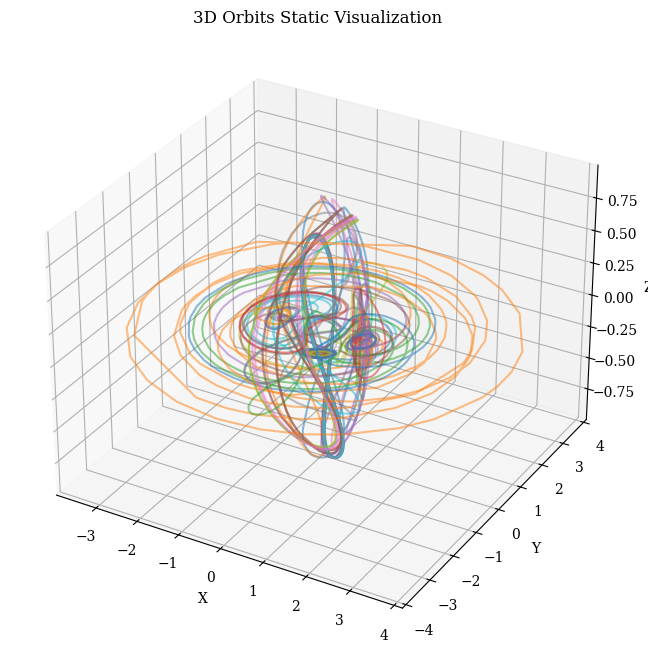

In [69]:
visualize_static_orbits(reordered_refined_orbits[:,1:,:], show_legend=False, save_path=refined_orbits_path)

Generation that didn't manage to get refined

In [70]:
non_refined_ids = sorted(set(range(3*params['samples_to_generate'])) - set(refined_ids))
generated_data_that_was_not_refined = generation[non_refined_ids]
generated_data_that_was_not_refined.shape

(173, 7, 100)

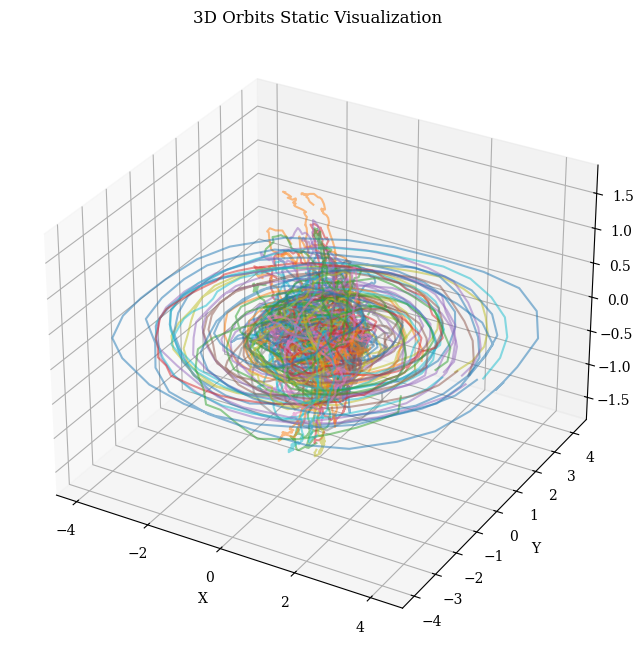

In [71]:
visualize_static_orbits(generated_data_that_was_not_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_did_not_converged_path)

## Latent Space

In [72]:
refined_scaled_data = scaler.transform(torch.from_numpy(refined_orbits).float())
refined_latent_means, refined_latent_log_vars = model.encode(refined_scaled_data)
refined_latent_means = refined_latent_means.detach().numpy()
refined_latent_log_vars = refined_latent_log_vars.detach().numpy()
refined_latent_representations = np.concatenate((refined_latent_means, refined_latent_log_vars), axis=1)
refined_latent_representations.shape

(127, 12)

Saved plot to ../experiments/experiment_36/images/exp36_combined_latent_space


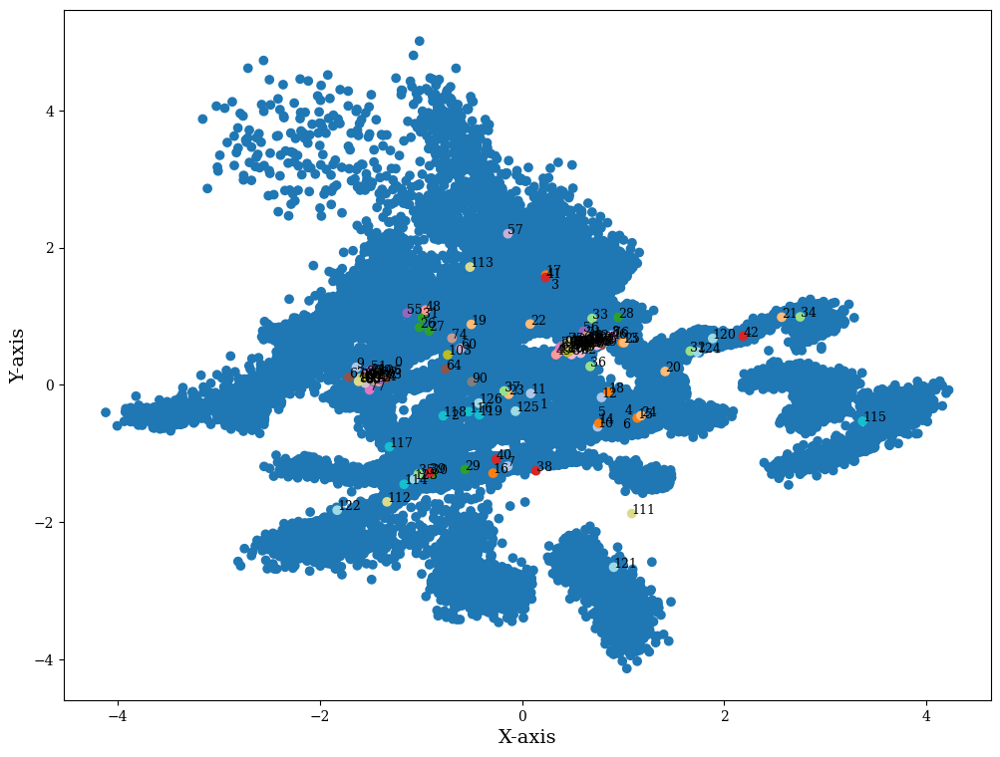

In [73]:
if refined_latent_means.shape[1]>2:
    reduction_technique = 'PCA'
    rls=reduce_dimensions_combined_latent_space(train_latent=latent_means,
                                        val_latent=refined_latent_means,
                                        techniques=[reduction_technique])

    plot_combined_2d_latent_space(
    real_latent=rls[reduction_technique]['train'], 
    synthetic_latent=rls[reduction_technique]['val'],
    synthetic_labels=list(range(0, len(refined_scaled_data))),
    annotation_mode='numbers',
    save_path=combined_latent_space_path
    )

else:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=refined_latent_means,
        synthetic_labels=list(range(0, len(refined_scaled_data))),
        annotation_mode='numbers',
        save_path=combined_latent_space_path
    )

In [74]:
scaled_generation = scaler.transform(torch.from_numpy(generation).float())
latent_generation_means, _ = model.encode(scaled_generation)
latent_generation_means = latent_generation_means.detach().numpy()
latent_generation_means_that_refined = latent_generation_means[refined_ids]

if refined_latent_means.shape[1]>2:
    latent_generation_means_that_refined_2d=reduce_dimensions_latent_space(latent_generation_means_that_refined,
                                    np.array(range(len(latent_generation_means_that_refined))),
                                    techniques=[reduction_technique], show_legend=False, plot=False)
    generation_to_refinement = np.stack((latent_generation_means_that_refined_2d[reduction_technique], rls[reduction_technique]['val']), axis=1)
else:
    generation_to_refinement = np.stack((latent_generation_means_that_refined, refined_latent_means), axis=1)

generation_to_refinement.shape

(127, 2, 2)

Saved plot to ../experiments/experiment_36/images/exp36_combined_latent_space_arrows


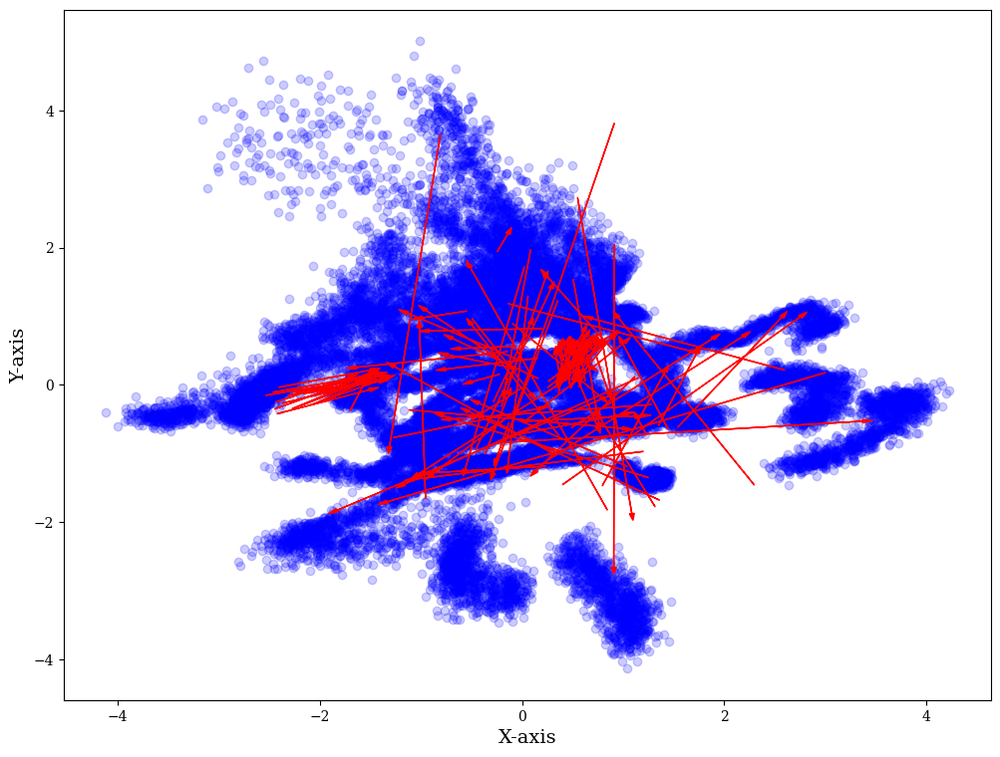

In [75]:
if refined_latent_means.shape[1]>2:
    reduction_technique = 'PCA'
    rls=reduce_dimensions_combined_latent_space(train_latent=latent_means,
                                        val_latent=refined_latent_means,
                                        techniques=[reduction_technique])

    plot_combined_2d_latent_space(
        real_latent=rls[reduction_technique]['train'], 
        synthetic_latent=generation_to_refinement,
        annotation_mode='numbers',
        save_path=combined_latent_space_arrows_path
    )

else:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=generation_to_refinement,
        annotation_mode='numbers',
        save_path=combined_latent_space_arrows_path
    )

In [76]:
generation_to_refinement_latent_distance = calculate_pairwise_distances(latent_generation_means_that_refined, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['latent_distance_to_generation'] = generation_to_refinement_latent_distance

## Features

Calculate Jacobi Constant on the dataset

In [77]:
results = np.array([jacobi_constant(np.transpose(data[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(data.shape[0])])
orbit_df['calculated_jacobi'] = results

orbit_df.head()

,id_class,x_0,y_0,x_0,vx_0,vy_0,vz_0,jacobi,period,stability,propagated_periods,calculated_jacobi
0,1.0,0.941000,1.900442e-23,0.509474,2.968938e-13,-0.124968,-3.122717e-12,2.745412,11.555291,211.184678,3.0,2.757415
1,1.0,0.941538,-8.592698e-24,0.508602,2.902340e-13,-0.125672,-3.252212e-12,2.746226,11.551622,210.329145,3.0,2.758229
2,1.0,0.942076,6.956604e-24,0.507729,2.685527e-13,-0.126375,-2.862050e-12,2.747039,11.547936,209.473685,3.0,2.759042
3,1.0,0.942613,1.763946e-24,0.506856,3.153637e-13,-0.127078,-3.791054e-12,2.747850,11.544233,208.618315,3.0,2.759853
4,1.0,0.943150,9.441804e-24,0.505982,2.663322e-13,-0.127781,-2.982720e-12,2.748660,11.540511,207.763051,3.0,2.760663


Calculate Jacobi Constant and Period on the Refined Orbits

In [78]:
new_jacobis = np.array([jacobi_constant(np.transpose(refined_orbits[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(refined_orbits.shape[0])])
refined_orbits_df['calculated_jacobi'] = new_jacobis
refined_orbits_df.rename(columns={'new_period': 'period'}, inplace=True)
refined_orbits_df['period_distance_with_generation'] = abs(refined_orbits_df['period'] - refined_orbits_df['old_period'])
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric.1,correct_order.1,inversions.1,kendall_tau_distance.1,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,2.507466,1.278837,0.092664,30810,0.000859,30787,1.967273,18.067548,2.529452,1.473080,22,1.137199,10,0.299181,0.177583,26,1.144660,29.0,29.0,60.0,82.0,35.0,0.014141,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,0.687392,0.988646,0.256935,24263,0.000219,24301,6.195145,17.485866,1.752072,1.731676,17,0.774913,10,0.182968,0.409377,20,0.780178,21.0,21.0,246.0,66.0,163.0,0.065859,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,1.654813,0.543481,0.284362,19684,0.000526,19717,4.485208,24.355919,2.807363,2.106530,13,0.471571,15,0.169371,0.603150,16,0.470883,17.0,17.0,112.0,77.0,75.0,0.030303,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,2.169327,3.112600,0.485831,14967,0.000247,16529,0.682594,20.105916,2.009000,4.021441,11,0.727810,27,0.595025,0.262876,13,0.728930,13.0,14.0,232.0,69.0,148.0,0.059798,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,1.638764,2.876062,0.176215,41484,0.003867,41526,3.864567,5.938849,1.636447,5.316860,31,0.353873,36,0.440313,0.612380,36,0.347611,39.0,39.0,68.0,85.0,38.0,0.015354,68.0,85.0,38.0,0.015354


Compare Features between Dataset and Refinement

Saved plot to ../experiments/experiment_36/images/exp36_features


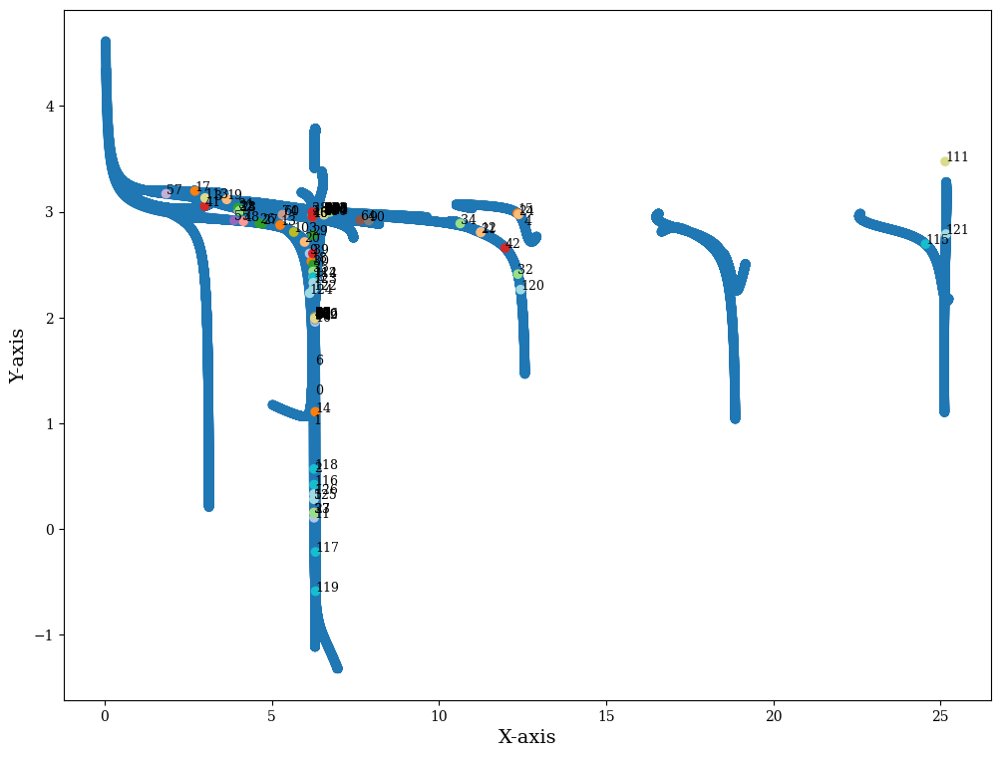

In [79]:
features_used = ['period', 'calculated_jacobi']

dataset_features = orbit_df[features_used].values
refined_orbits_features = refined_orbits_df[features_used].values 

closest_feature_indices, feature_distances = find_nearest_points_batch(refined_orbits_features, dataset_features,
                                                                       n=1, distance_metric=params['distance_metric'])

refined_orbits_df['feature_closest_orbit'] = closest_feature_indices
refined_orbits_df['feature_distance_from_closest_orbit'] = feature_distances

plot_combined_2d_latent_space(dataset_features, refined_orbits_features,
                              synthetic_labels=list(range(0, len(refined_scaled_data))),
                              annotation_mode='numbers', save_path=features_plot_path)

Feature Centroids

In [80]:
array_features = orbit_df[features_used].to_numpy()
feature_centroid = orbit_df[features_used].mean().to_numpy()
feature_centroids = compute_centroids(array_features, orbits_id_classes, method='mean')
feature_centroids.shape

(40, 2)

In [81]:
stdev_feature_centroids  = orbit_df.groupby('id_class')[features_used].std().values
stdev_feature_centroids.shape

(40, 2)

In [82]:
feature_centroid = orbit_df[features_used].mean().values
feature_centroid.shape

(2,)

In [83]:
full_unique_classes = list(set(orbits_id_classes))
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

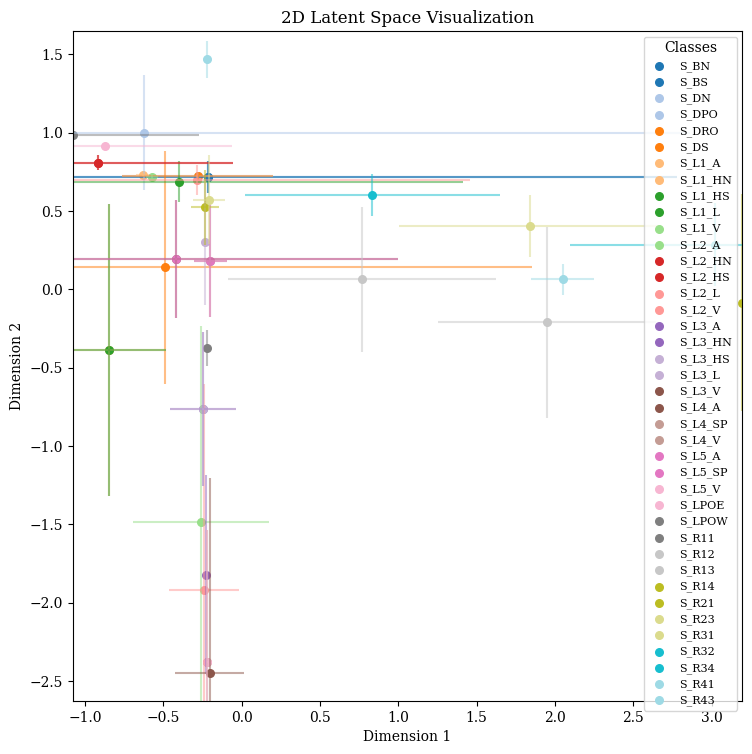

In [84]:
if len(features_used)==2:
    plot_2d_latent_space(feature_centroids,np.array(full_family_names), latent_stdevs=stdev_feature_centroids, save_path=family_feature_centroids_plot_path)

## Calculate distances

In [85]:
if data.shape[1] == 7:
    no_time_data = data[:,1:,:]
    no_time_refined_orbits = refined_orbits[:,1:,:]
    no_time_generated_data_that_was_refined = generated_data_that_was_refined[:,1:,:]
else:
    no_time_data = data
    no_time_refined_orbits = refined_orbits
    no_time_generated_data_that_was_refined = generated_data_that_was_refined

print(no_time_data.shape)
print(no_time_refined_orbits.shape)
print(no_time_generated_data_that_was_refined.shape)
print(no_time_generation.shape)


(45211, 6, 100)
(127, 6, 100)
(127, 6, 100)
(300, 6, 100)


### Orbit Distances

1. Nearest Orbit

In [86]:
nearest_indices_generation, nearest_distances_generation = find_nearest_orbits_batch(no_time_generation,
                                                                                     no_time_data,
                                                                                     n=1,
                                                                                     distance_metric=params['distance_metric'])
generation_df['nearest_orbit'] = nearest_indices_generation
generation_df['nearest_orbit_distance'] = nearest_distances_generation

In [87]:
nearest_indices_refined_generation, nearest_distances_refined_generation = find_nearest_orbits_batch(no_time_refined_orbits,
                                                                                                     no_time_data,
                                                                                                     n=1,
                                                                                                     distance_metric=params['distance_metric'])
refined_orbits_df['nearest_orbit'] = nearest_indices_refined_generation
refined_orbits_df['nearest_orbit_distance'] = nearest_distances_refined_generation

2. Generation vs Refinement

In [88]:
pairwise_distances = calculate_pairwise_orbit_distances(no_time_generated_data_that_was_refined,
                                                        no_time_refined_orbits, distance_metric=params['distance_metric'])
refined_orbits_df['distance_from_generation'] = pairwise_distances

### Point Distances

3. Distance from the centre

In [89]:
# Latent space distance
centroid_distances = calculate_distances_batch(full_data_centroid, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['centroid_distance'] = centroid_distances

In [90]:
# Feature distance
feature_centroid_distances = calculate_distances_batch(feature_centroid, refined_orbits_features, distance_metric=params['distance_metric'])
refined_orbits_df['feature_centroid_distance'] = feature_centroid_distances

4. Distance from centroids

In [91]:
# Latent Space Centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_centroid_distance'] = closest_family_centroid_distance

In [92]:
# Feature Space Centroids
closest_family_feature_centroid, closest_family_feature_centroid_distance = find_nearest_points_batch(refined_orbits_features, feature_centroids, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_feature_centroid'] = closest_family_feature_centroid
refined_orbits_df['closest_family_feature_centroid_distance'] = closest_family_feature_centroid_distance

5. Initial Conditions

In [93]:
# Extract initial and final conditions
initial_conditions = refined_orbits_df[['initial_pos_x0', 'initial_pos_y0', 'initial_pos_z0',
                        'initial_vel_x0', 'initial_vel_y0', 'initial_vel_z0']].values
final_conditions = refined_orbits_df[['final_pos_x0', 'final_pos_y0', 'final_pos_z0',
                      'final_vel_x0', 'final_vel_y0', 'final_vel_z0']].values

ics_distances = calculate_pairwise_distances(initial_conditions, final_conditions, distance_metric=params['distance_metric'])
refined_orbits_df['initial_conditions_distance'] = ics_distances

## Export Features

In [94]:
generation_df.to_csv(generation_df_path, index=False)
generation_df.shape

(300, 9)

In [95]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance,nearest_orbit,nearest_orbit_distance
0,0.110781,0.195583,0.503514,160.0,73.0,101.0,0.040808,38895,6.813253
1,0.208550,0.245012,0.154507,312.0,71.0,207.0,0.083636,24624,3.397857
2,0.187494,0.342019,1.569321,118.0,82.0,78.0,0.031515,24079,2.707482
3,0.829540,1.227539,1.310902,624.0,63.0,435.0,0.175758,19128,14.586423
4,0.068922,0.197615,1.477347,100.0,79.0,63.0,0.025455,3608,5.643532


In [96]:
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(127, 51)

In [97]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric.1,correct_order.1,inversions.1,kendall_tau_distance.1,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,2.507466,1.278837,0.092664,30810,0.000859,30787,1.967273,18.320088,2.201267,1.473080,22,1.026709,10,0.299181,0.177583,26,1.144660,29.0,29.0,60.0,82.0,35.0,0.014141,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,0.687392,0.988646,0.256935,24263,0.000219,24301,6.195145,8.903842,1.849676,1.731676,17,0.807738,10,0.182968,0.409377,20,0.780178,21.0,21.0,246.0,66.0,163.0,0.065859,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,1.654813,0.543481,0.284362,19684,0.000526,19717,4.485208,21.895545,2.737438,2.106530,13,0.444968,15,0.169371,0.603150,16,0.470883,17.0,17.0,112.0,77.0,75.0,0.030303,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,2.169327,3.112600,0.485831,14967,0.000247,16529,0.682594,10.782526,1.893557,4.021441,11,0.771983,27,0.595025,0.262876,13,0.728930,13.0,14.0,232.0,69.0,148.0,0.059798,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,1.638764,2.876062,0.176215,41484,0.003867,41526,3.864567,15.774476,1.557001,5.316860,31,0.229256,36,0.440313,0.612380,36,0.347611,39.0,39.0,68.0,85.0,38.0,0.015354,68.0,85.0,38.0,0.015354


In [98]:
not_to_show_columns = ['initial_pos_x0','initial_pos_y0','initial_pos_z0',	'initial_vel_x0',	'initial_vel_y0',	'initial_vel_z0	final_pos_x0',	'final_pos_y0',	'final_pos_z0',	'final_vel_x0',	'final_vel_y0',	'final_vel_z0', 'inversions',	'kendall_tau_distance' , 'closest_feature_indices',	'nearest_orbit', 'closest_family_centroid', 'closest_family_feature_centroid']

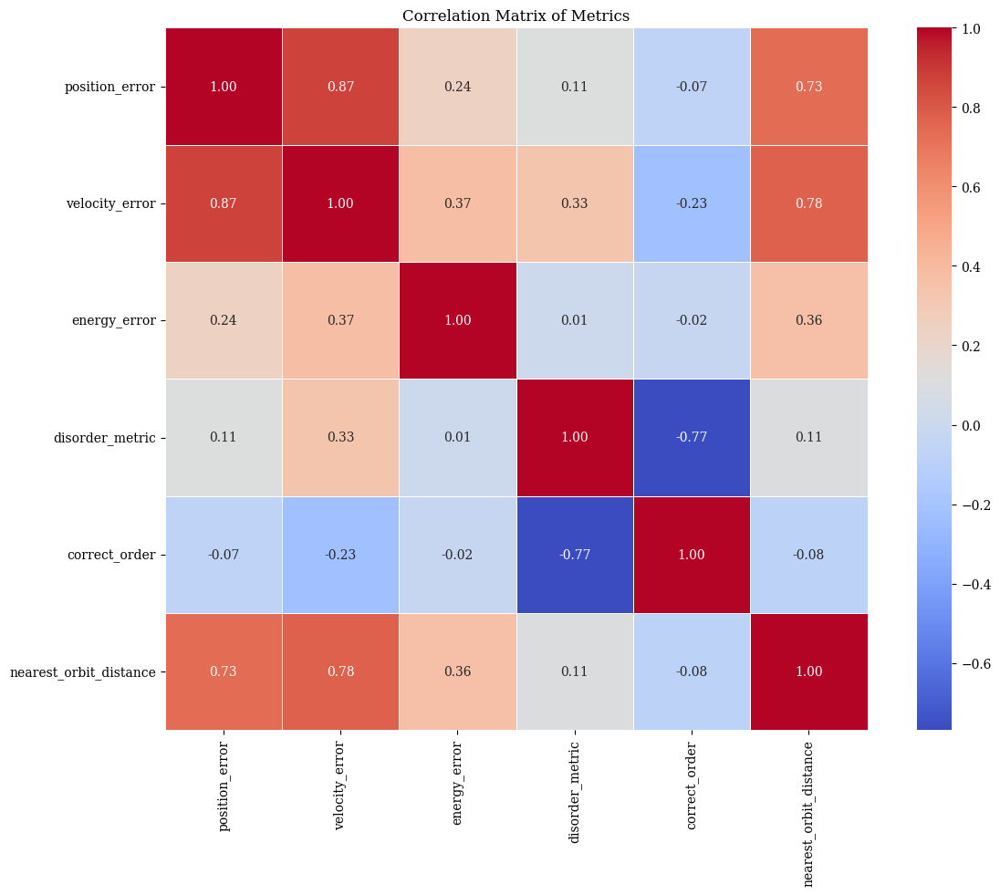

In [99]:
plot_corr_matrix(generation_df.drop(columns=not_to_show_columns, errors='ignore'))

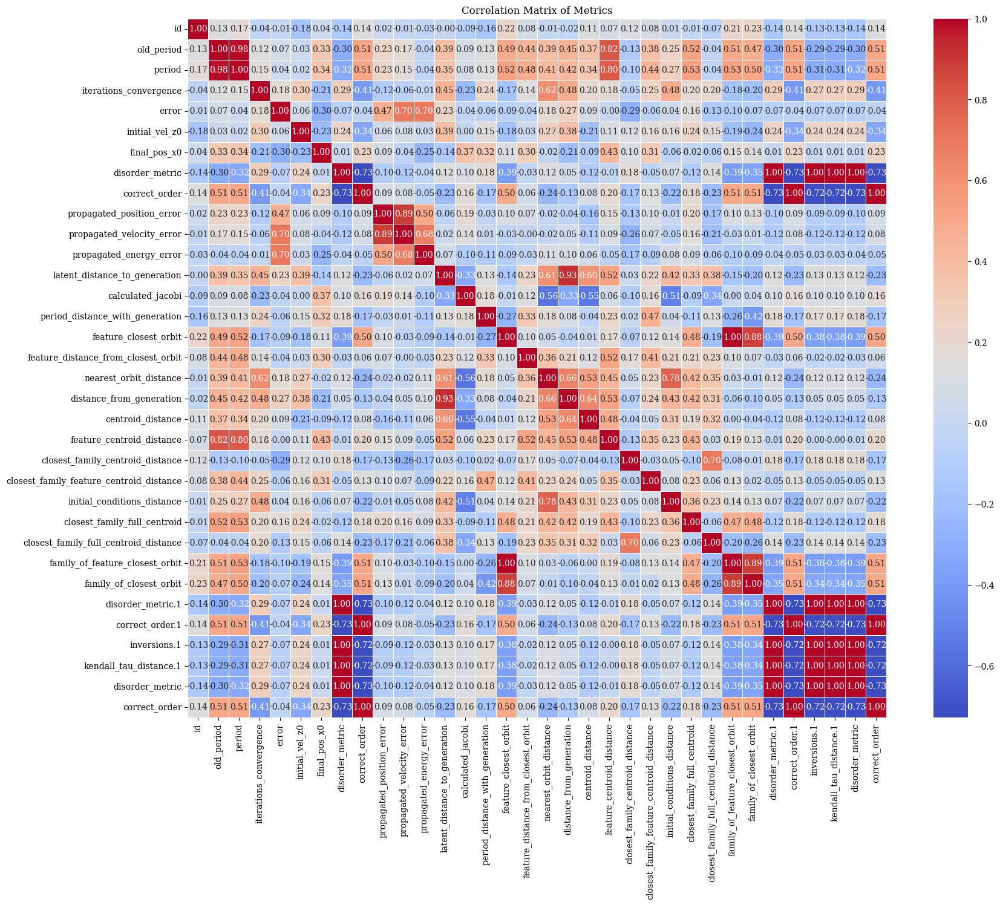

In [100]:
plot_corr_matrix(refined_orbits_df.drop(columns=not_to_show_columns, errors='ignore'), figsize=(20,15))

# Check Discovery

Calculate Full Centroid Distances

In [101]:
# Recalculate distance from latent space centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, full_centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_full_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_full_centroid_distance'] = closest_family_centroid_distance

In [102]:
family_mapping = orbit_df['id_class'].to_dict()

def get_class_name(orbit_id):
    return family_mapping.get(orbit_id, None)

refined_orbits_df['family_of_feature_closest_orbit'] = refined_orbits_df['feature_closest_orbit'].apply(get_class_name)
refined_orbits_df['family_of_closest_orbit'] = refined_orbits_df['nearest_orbit'].apply(get_class_name)
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(127, 51)

In [103]:
family_columns = ['family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
filter_condition = refined_orbits_df[family_columns].isin(discarded_family_ids).any(axis=1)
close_discovery_df = refined_orbits_df[filter_condition]
close_discovery_df.shape

(23, 51)

In [104]:
close_discovery_df[family_columns].head()

,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
2,17.0,17.0,15,16
13,11.0,7.0,9,5
18,22.0,24.0,19,2
19,2.0,15.0,6,11
22,7.0,7.0,6,6


In [105]:
filter_condition = refined_orbits_df[['family_of_feature_closest_orbit', 'family_of_closest_orbit']].isin(discarded_family_ids).any(axis=1)
discovery_df = refined_orbits_df[filter_condition]
discovery_df.shape

(14, 51)

In [106]:
family_orbit_columns = ['id','feature_closest_orbit', 'nearest_orbit', 'family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
discovery_df[family_orbit_columns]

,id,feature_closest_orbit,nearest_orbit,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
13,23,12734,7183,11.0,7.0,9,5
18,33,25057,26618,22.0,24.0,19,2
19,34,2138,18053,2.0,15.0,6,11
48,107,25363,5430,22.0,5.0,6,9
55,117,25385,5439,22.0,5.0,6,9
63,126,24738,27930,22.0,26.0,29,10
64,127,17230,5445,15.0,5.0,35,14
80,151,24747,27940,22.0,26.0,29,10
83,156,24742,27927,22.0,26.0,29,10
89,166,24761,27950,22.0,26.0,29,10


In [107]:
discarded_family_ids

[6.0, 31.0, 15.0, 11.0, 22.0]

In [108]:
refinement_indexes = discovery_df.index.to_list()
feature_closest_orbit_indexes = discovery_df['feature_closest_orbit'].to_list()
nearest_orbit_indexes = discovery_df['nearest_orbit'].to_list()

discovery_refinement = reordered_refined_orbits[refinement_indexes]
feature_closest_orbits = data[feature_closest_orbit_indexes]
nearest_orbits = data[nearest_orbit_indexes]

In [109]:
refinement_and_closers = np.stack(
    (discovery_refinement, feature_closest_orbits, nearest_orbits),
    axis=1
)
refinement_and_closers.shape

(14, 3, 7, 100)

## Visualize

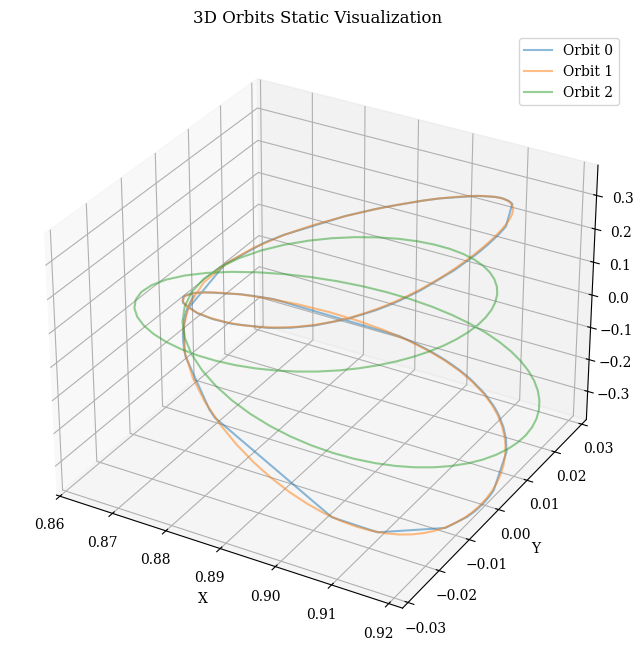

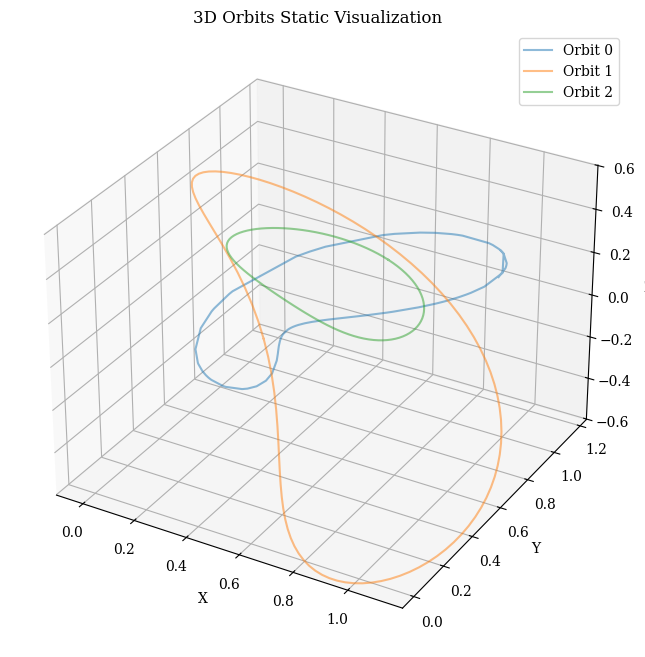

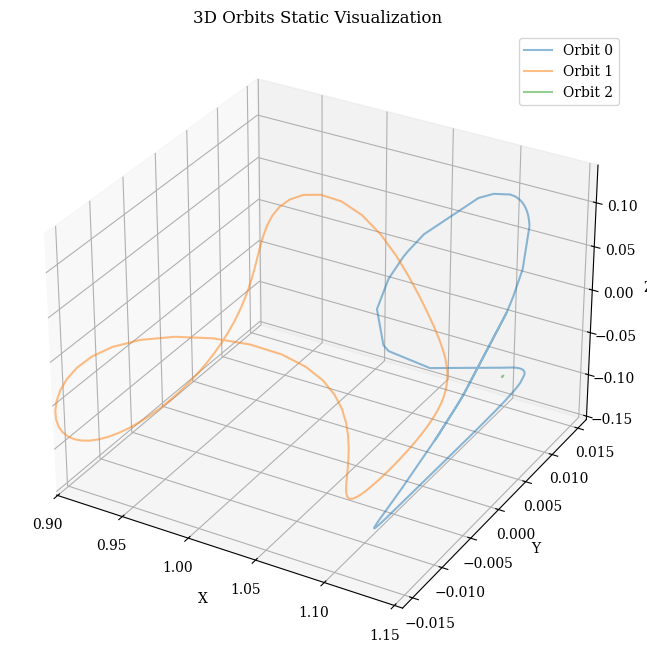

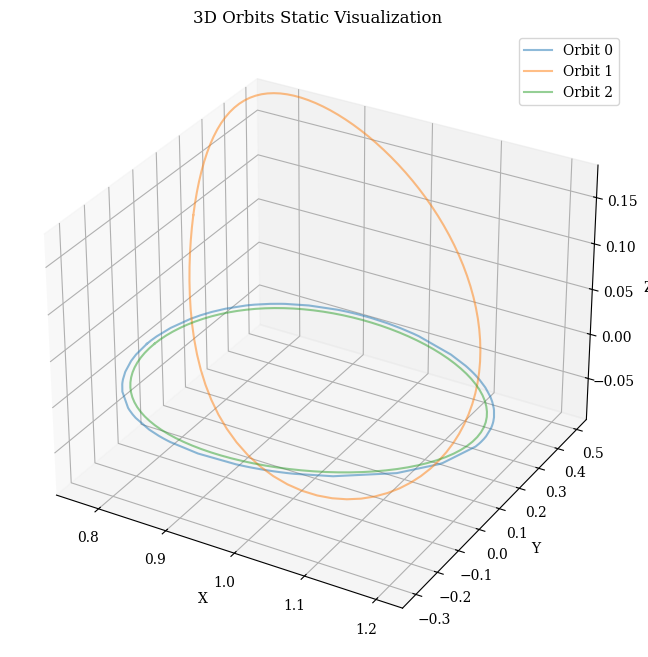

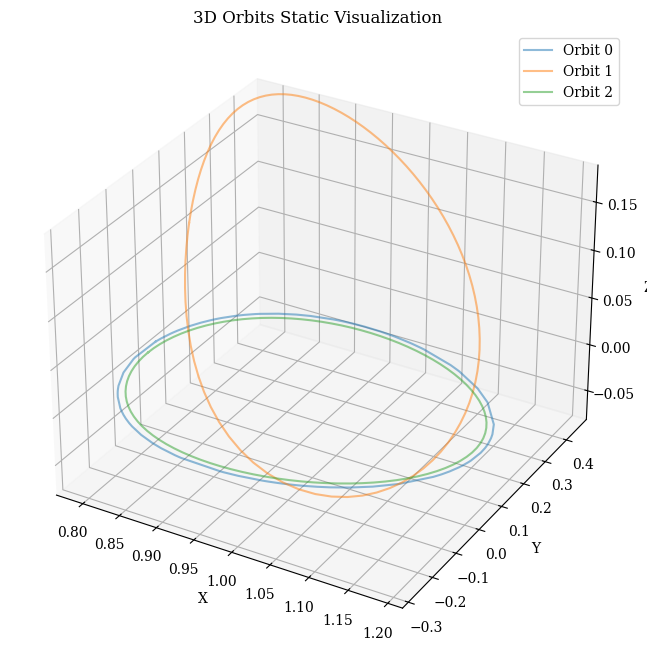

...

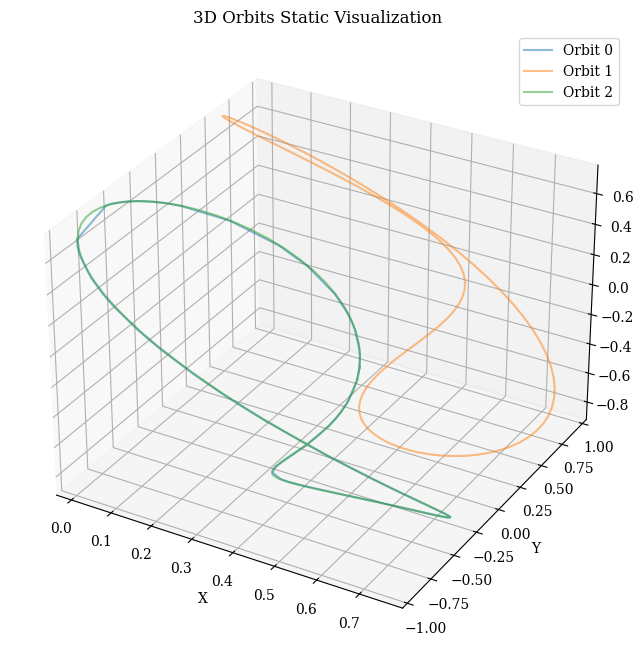

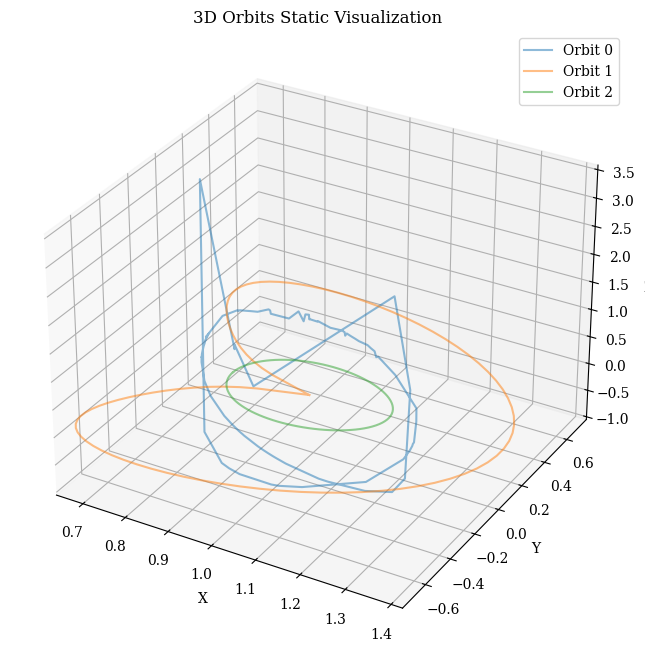

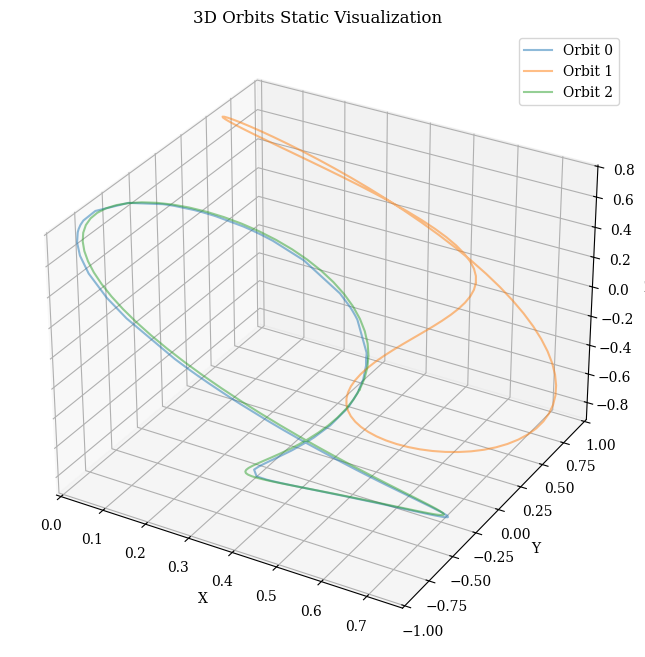

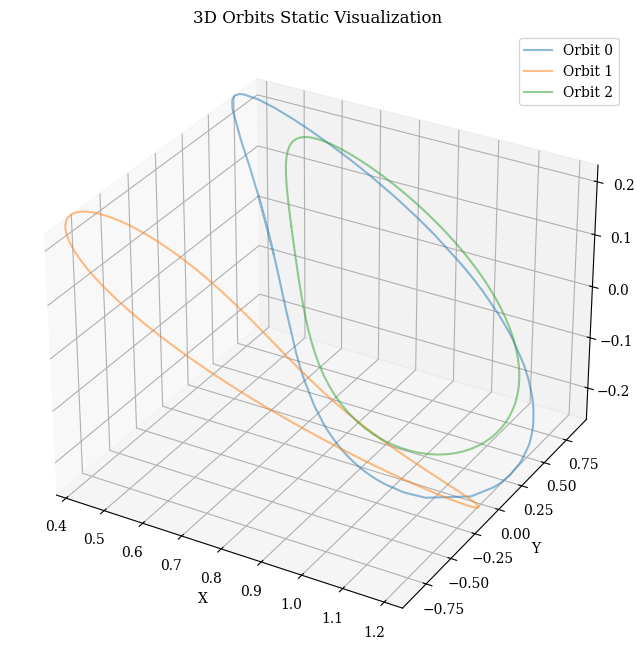

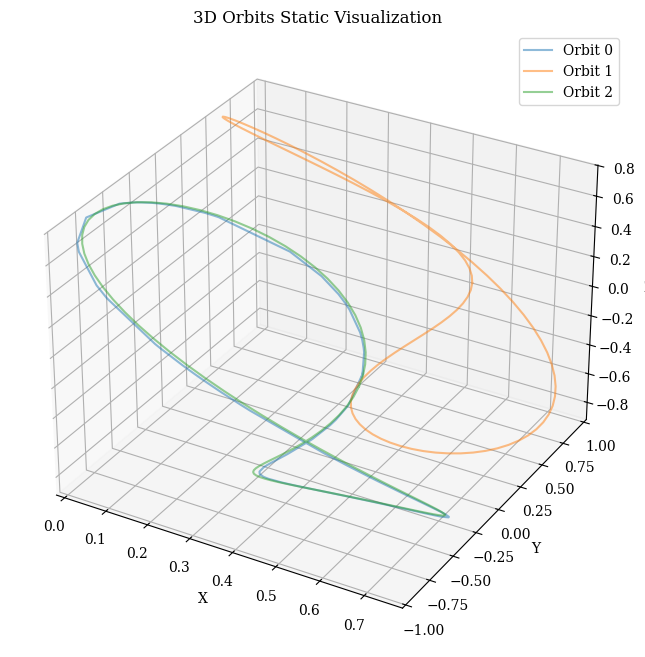

In [ ]:
for i in range(len(refinement_and_closers)):
    visualize_static_orbits(refinement_and_closers[i,:,1:,:])

In [111]:
if latent_means.shape[1]==2:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=generation_to_refinement[refinement_indexes],
        annotation_mode='numbers'
    )

In [112]:
discovery_generation_indexes = discovery_df['id'].values
discovery_generation = generation[discovery_generation_indexes]
discovery_generation.shape

(14, 7, 100)

In [114]:
discovery_generation_and_refinement = np.stack(
    (discovery_generation, discovery_refinement),
    axis=1
)
discovery_generation_and_refinement.shape

(14, 2, 7, 100)

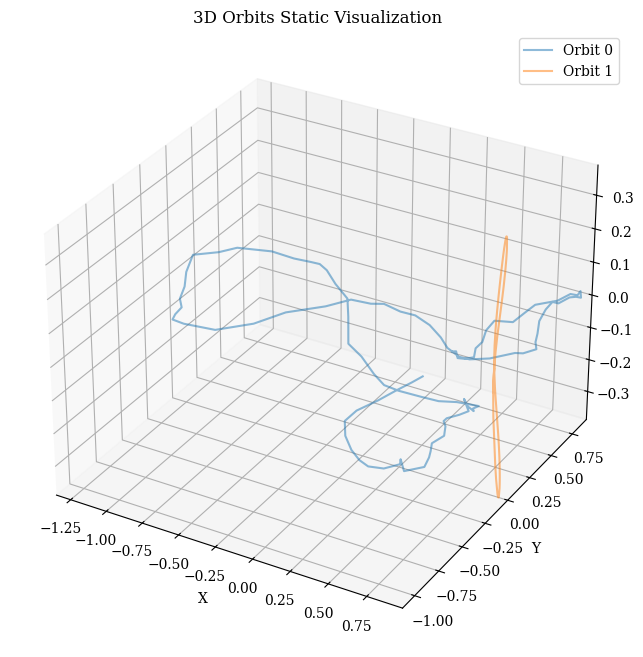

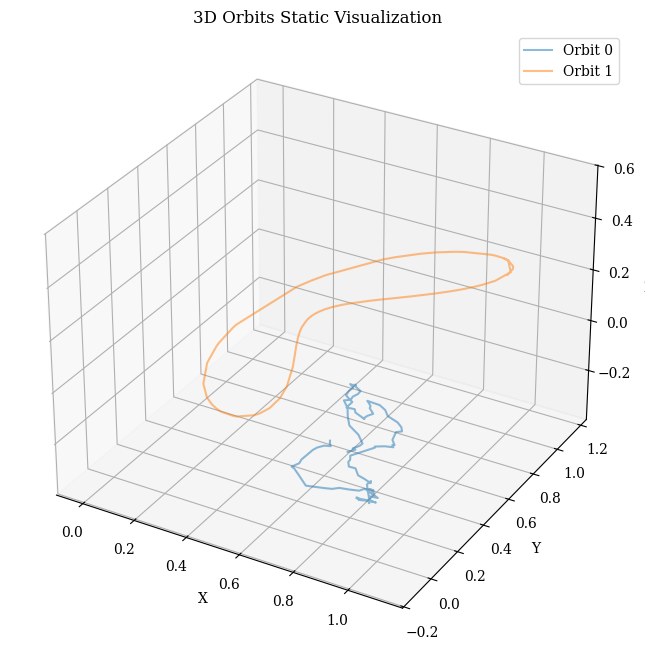

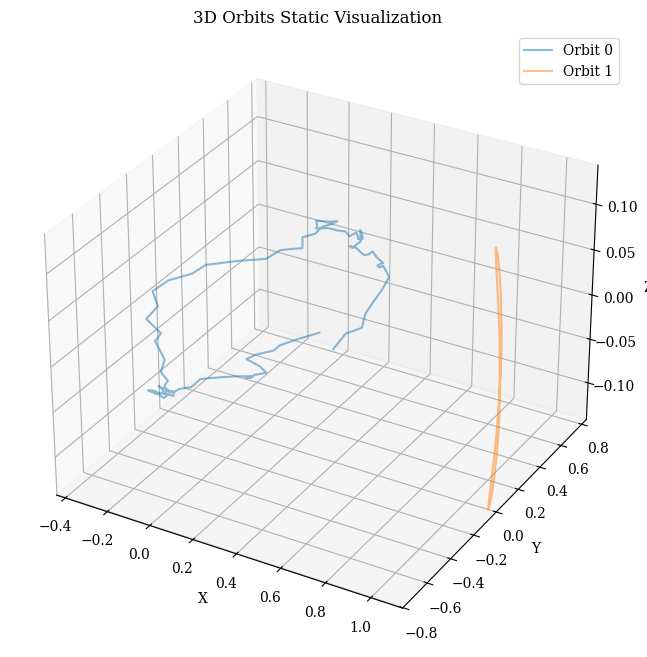

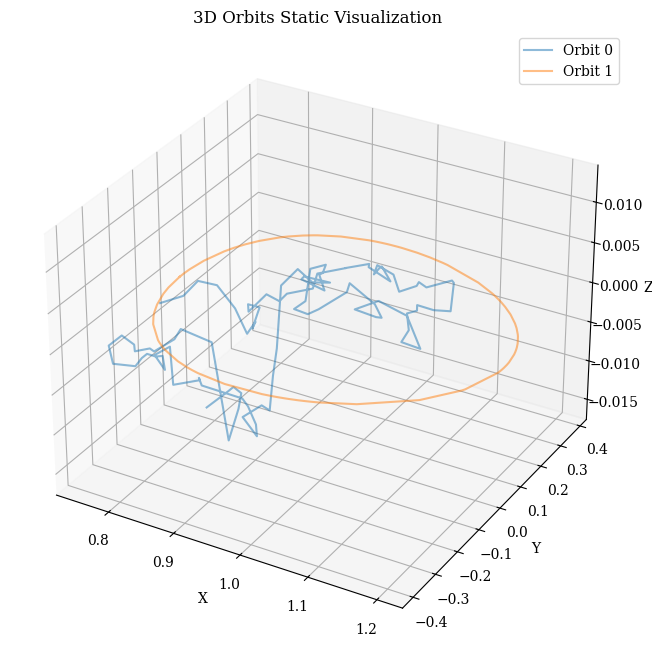

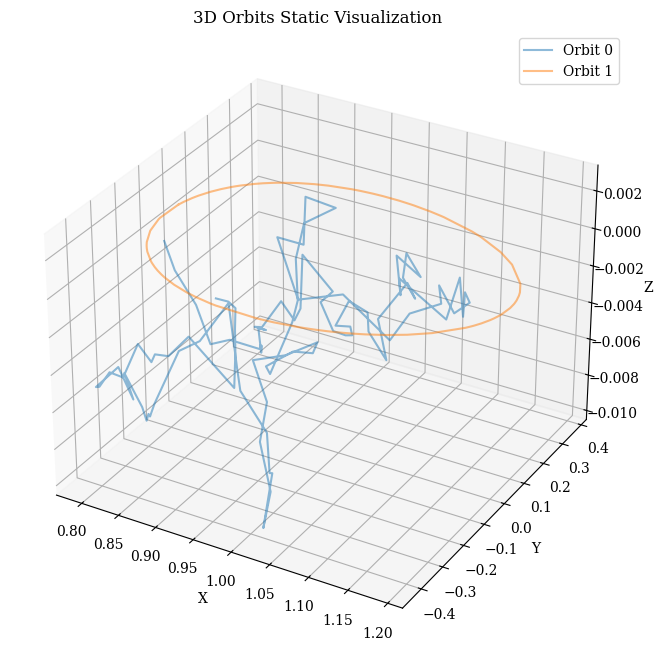

...

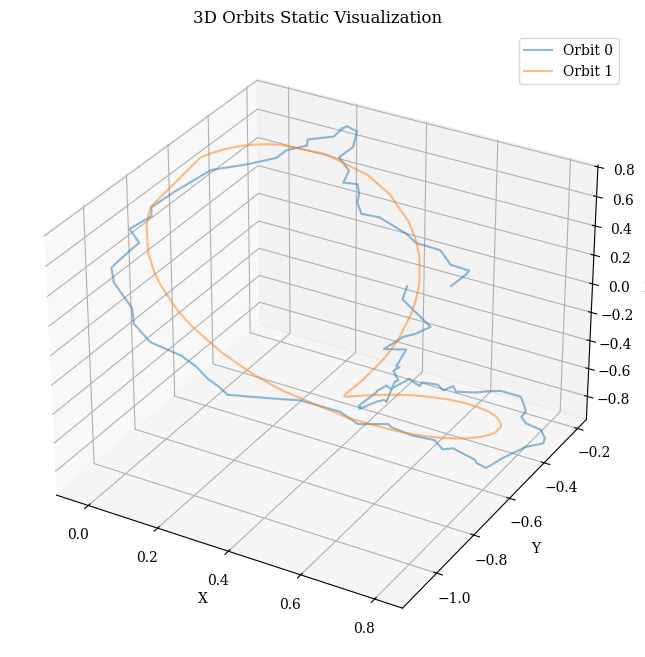

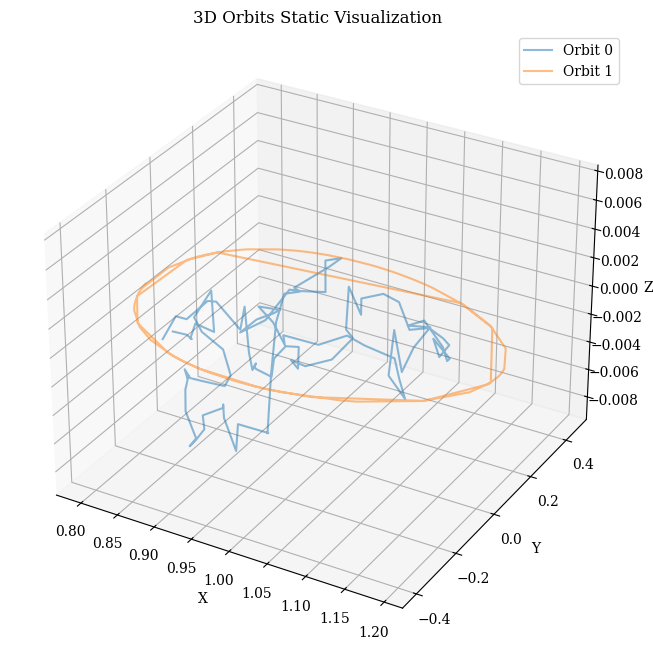

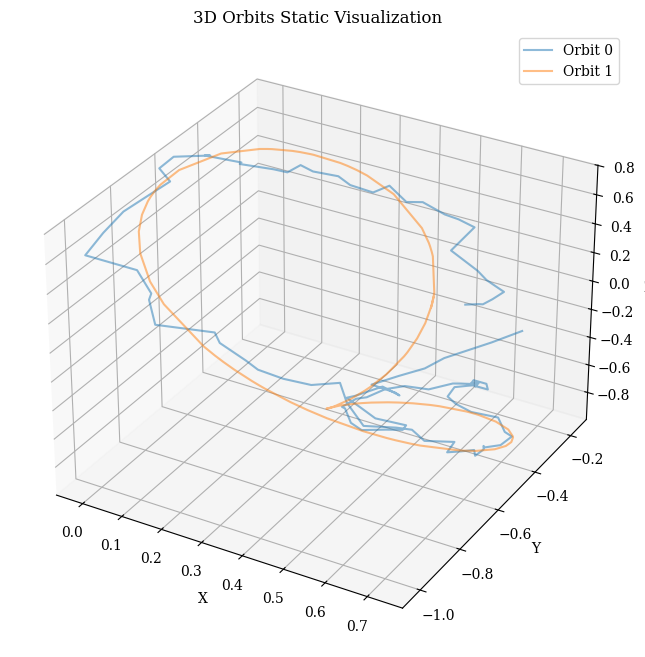

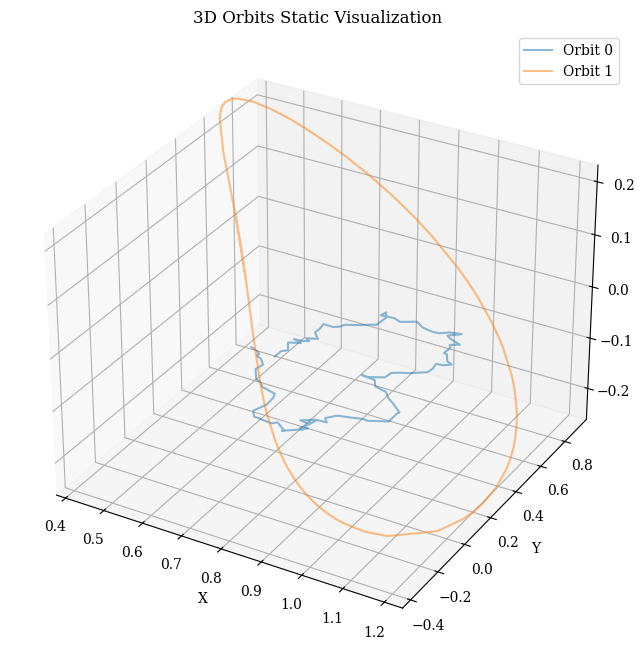

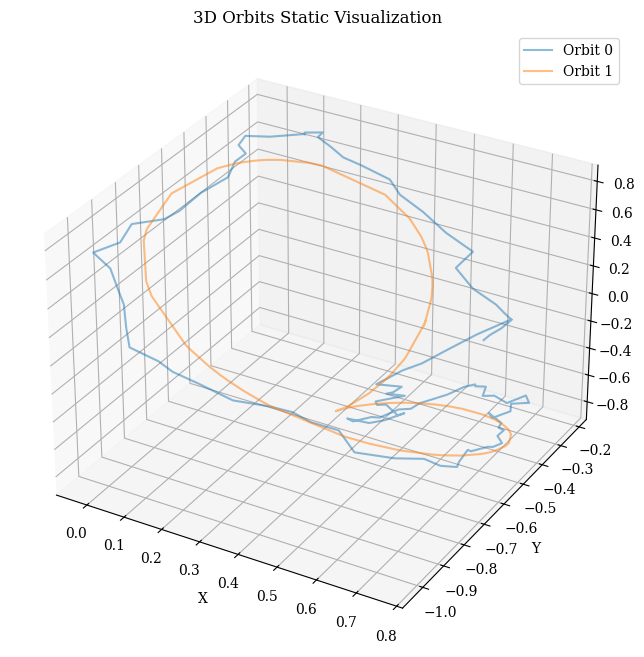

In [ ]:
for i in range(len(discovery_generation_and_refinement)):
    visualize_static_orbits(discovery_generation_and_refinement[i,:,1:,:])